# Introduction

This project is based on `Home Credit Default Risk` kaggle competiton. We have to predict how capable each applicant is of repaying a loan. There are 7 sources of data : 
- application_train: the main data with information about each loan application at Home Credit. Every loan has its own row and is identified by the feature SK_ID_CURR. The application data comes with the TARGET indicating 0: the loan was repaid or 1: the loan was not repaid. We will only be using application_train data and not the test data for our project.
- bureau: data concerning client's previous credits from other financial institutions. Each previous credit has its own row in bureau, but one loan in the application data can have multiple previous credits.
- bureau_balance: monthly data about the previous credits in bureau. Each row is one month of a previous credit, and a single previous credit can have multiple rows, one for each month of the credit length.
- previous_application: previous applications for loans at Home Credit of clients who have loans in the application data. Each current loan in the application data can have multiple previous loans. Each previous application has one row and is identified by the feature SK_ID_PREV.
- POS_CASH_BALANCE: monthly data about previous point of sale or cash loans clients have had with Home Credit. Each row is one month of a previous point of sale or cash loan, and a single previous loan can have many rows.
- credit_card_balance: monthly data about previous credit cards clients have had with Home Credit. Each row is one month of a credit card balance, and a single credit card can have many rows.
- installments_payment: payment history for previous loans at Home Credit. There is one row for every made payment and one row for every missed payment.

For more information about the data you can refer the data description file provided in the kaggle competition. Also a few datasets are related to each other :
- bureau_balance is related to bureau by SK_ID_BUREAU and bureau has a feature SK_ID_CURR relating it to main application data.
- POS_CASH_BALANCE,installments_payment and credit_card_balance have a feature named SK_ID_PREV relating it to previous_application data but they also have a feature named SK_ID_CURR directly relating them to the application data.

This projects is going to be divided into phases and will be written in seperate Notebooks. The 3 phases of the project are as follows:
>1. EDA
>2. Feature Engineering
>3. Feature Selection, Model Building and Evaluation


Here we will begin with the EDA and we will do it for each data source.So without any futher delay Let us begin....

# EDA for Home Loan Default Risk Management

# 1. Importing Required dependencies

In [1]:
# Importing Dependencies
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
plt.rcParams['font.size'] = 15
plt.rcParams['figure.figsize'] = (10, 6)
import seaborn as sns
pd.set_option('display.max_columns',None) 
import warnings
warnings.filterwarnings('ignore')

# 2. Application_train Data

In [2]:
app_train=pd.read_csv('application_train.csv')
app_train

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.0220,0.0198,0.0,0.0000,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.0000,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.0790,0.0554,0.0,0.0000,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.0100,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

# 2.1 Basic Checks 

In [3]:
print('-'*100)
print('Shape of the DataFrame:',app_train.shape)
print('-'*100)
print('Info of the DataFrame: \n',app_train.info())
print('-'*100)
print('Describe the DataFrame: \n',app_train.describe())
print('-'*100)
print('Describe object types of the DataFrame: \n',app_train.describe(include='O'))
print('-'*100)
print('Datatype of Each Column: \n',app_train.dtypes)
print('-'*100)
print('Duplicated Values: ',app_train.duplicated().sum())
print('-'*100)

----------------------------------------------------------------------------------------------------
Shape of the DataFrame: (307511, 122)
----------------------------------------------------------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB
Info of the DataFrame: 
 None
----------------------------------------------------------------------------------------------------
Describe the DataFrame: 
           SK_ID_CURR         TARGET   CNT_CHILDREN  AMT_INCOME_TOTAL  \
count  307511.000000  307511.000000  307511.000000      3.075110e+05   
mean   278180.518577       0.080729       0.417052      1.687979e+05   
std    102790.175348       0.272419       0.722121      2.371231e+05   
min    100002.000000       0.000000       0.000000      2.565000e+04   
25%    189145.500000       0.000000

Describe object types of the DataFrame: 
        NAME_CONTRACT_TYPE CODE_GENDER FLAG_OWN_CAR FLAG_OWN_REALTY  \
count              307511      307511       307511          307511   
unique                  2           3            2               2   
top            Cash loans           F            N               Y   
freq               278232      202448       202924          213312   

       NAME_TYPE_SUITE NAME_INCOME_TYPE            NAME_EDUCATION_TYPE  \
count           306219           307511                         307511   
unique               7                8                              5   
top      Unaccompanied          Working  Secondary / secondary special   
freq            248526           158774                         218391   

       NAME_FAMILY_STATUS  NAME_HOUSING_TYPE OCCUPATION_TYPE  \
count              307511             307511          211120   
unique                  6                  6              18   
top               Married  House / apartment

# 2.2 Missing Values

In [4]:
# Create a fuction to show missing values
def missingdata(data):
    total = data.isnull().sum().sort_values(ascending = False)
    percent = (data.isnull().sum()/data.isnull().count()*100).sort_values(ascending = False)
    ms=pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
    ms= ms[ms["Percent"] > 0]
    f,ax =plt.subplots(figsize=(15,10))
    plt.xticks(rotation='90')
    fig=sns.barplot(ms.index, ms["Percent"],alpha=0.8)
    plt.xlabel('Features', fontsize=15)
    plt.ylabel('Percent of missing values', fontsize=15)
    plt.title('Percent missing data by feature', fontsize=15)
    print ("Your selected dataframe has " + str(data.shape[1]) + " columns.\n"      
            "There are " + str(ms.shape[0]) +
              " columns that have missing values.")
    return ms

Your selected dataframe has 122 columns.
There are 67 columns that have missing values.


,Total,Percent
COMMONAREA_MEDI,214865,69.872297
COMMONAREA_AVG,214865,69.872297
COMMONAREA_MODE,214865,69.872297
NONLIVINGAPARTMENTS_MODE,213514,69.432963
NONLIVINGAPARTMENTS_AVG,213514,69.432963
...,...,...
EXT_SOURCE_2,660,0.214626
AMT_GOODS_PRICE,278,0.090403
AMT_ANNUITY,12,0.003902
CNT_FAM_MEMBERS,2,0.000650


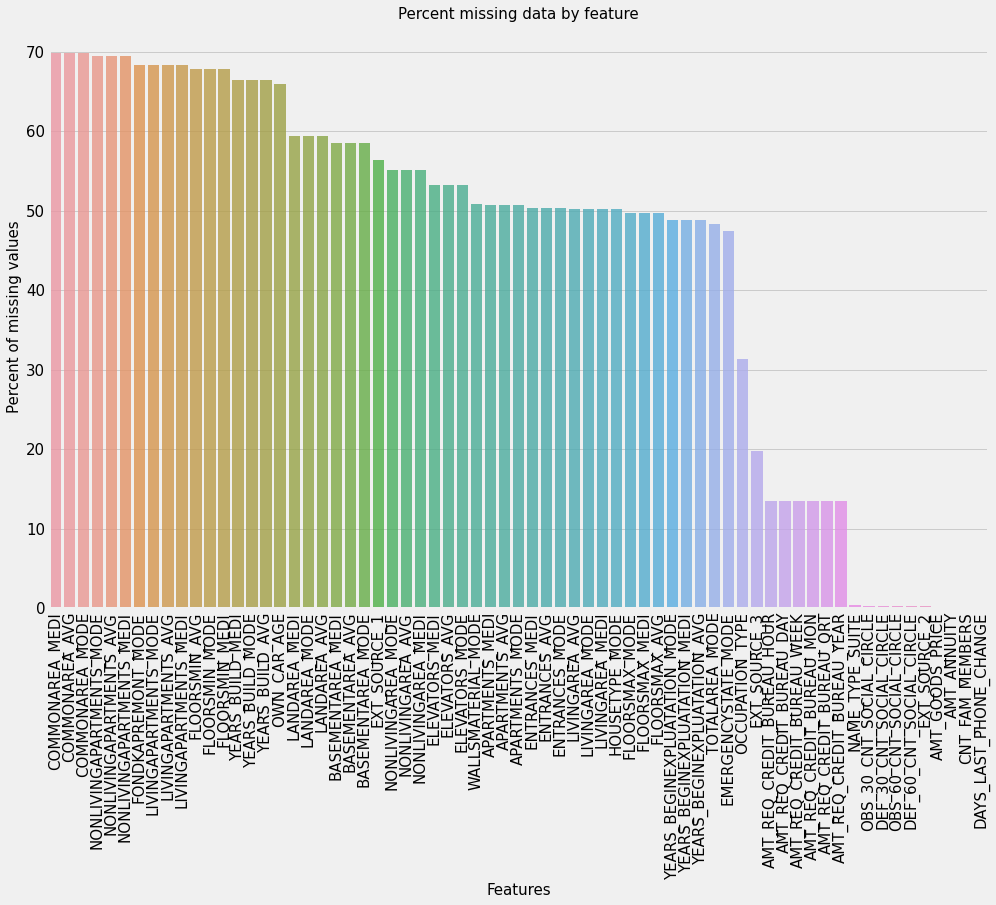

In [5]:
# Pass the dataframe to the fuction
miss_data_app_train=missingdata(app_train)
miss_data_app_train

> There are lot of missing values. We will have to impute them with something meaningful.

# 2.3 Finding Relationship between Missing Values and Target Variable

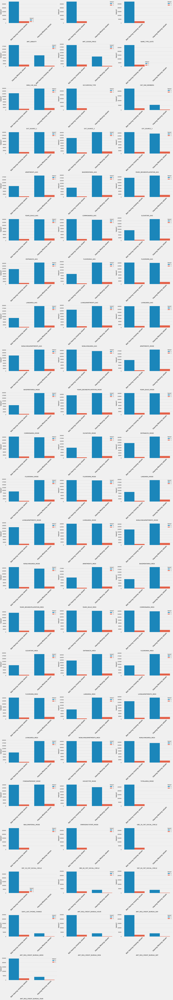

In [6]:
plt.figure(figsize=(35,200))
plotnumber = 1
missing_values_app_train_list=miss_data_app_train.index
for column in app_train.columns:
    if column in missing_values_app_train_list:
        if plotnumber<=67:
            ax = plt.subplot(23,3,plotnumber)
            data = app_train.copy() # Create a dummy dataframe
            data[column] = np.where(data[column].isnull(), 'Having Missing values', 'Not Having missing values')
            sns.countplot(x=data[column]
                        ,hue=data.TARGET)
            plt.xlabel(column,fontsize=20) 
            plt.ylabel('TARGET',fontsize=20)
            plt.xticks(fontsize=25,rotation=45)
        plotnumber+=1
plt.tight_layout()

> There is certainly a relationship between Target Variable and Missing values. We will have to consider this before dropping any column

# 2.4 Target Variable

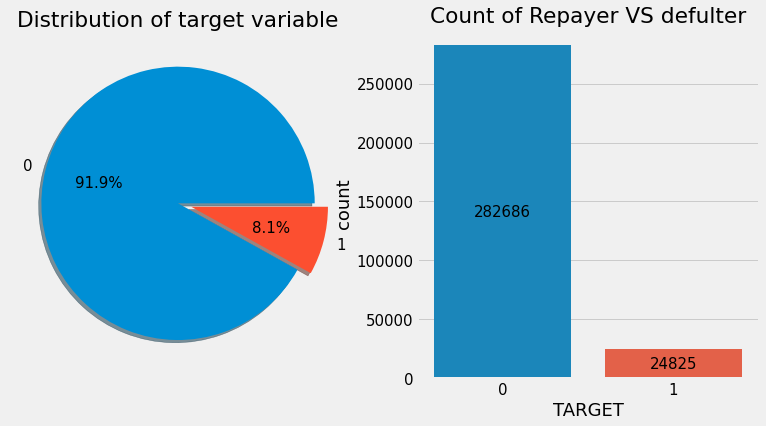

In [7]:
f,ax=plt.subplots(1,2,figsize=(12,6))
app_train.TARGET.value_counts().plot.pie(explode=[0,0.1],autopct='%1.1f%%',ax=ax[0],shadow=True)
ax[0].set_title('Distribution of target variable')
ax[0].set_ylabel('')
sns.countplot('TARGET',data=app_train,ax=ax[1])
annotations = ax[1].bar_label(ax[1].containers[0], fmt='%g',label_type='center')
ax[1].set_title('Count of Repayer VS defulter')
plt.show()

> From this information, we see this is an imbalanced class problem. There are far more loans that were repaid on time than loans that were not repaid. 

# 2.5 Numerical Features

In [8]:
num_fe_app_train=[feature for feature in app_train.columns if app_train[feature].dtype!='O'and feature not in ['SK_ID_CURR','TARGET']]
print('The no. of Numerical features in app_train is : ',len(num_fe_app_train))
print('The Numerical features in app_train is : \n',num_fe_app_train)

The no. of Numerical features in app_train is :  104
The Numerical features in app_train is : 
 ['CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'ELEVATORS_AVG', 'ENTRANCES_AVG', 'FLOORSMAX_AVG', 'FLOORSMIN_AVG', 'LANDAREA_AVG', 'LIVINGAPARTMENTS_AVG', 'LIVINGAREA_AVG', 'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAREA_AVG', 'APAR

## Number of unique values in each Numeric feature

In [9]:
for feature in num_fe_app_train:
    print('The no. of unique values in {} feature of app_train is : {}'.format(feature,app_train[feature].nunique()))

The no. of unique values in CNT_CHILDREN feature of app_train is : 15
The no. of unique values in AMT_INCOME_TOTAL feature of app_train is : 2548
The no. of unique values in AMT_CREDIT feature of app_train is : 5603
The no. of unique values in AMT_ANNUITY feature of app_train is : 13672
The no. of unique values in AMT_GOODS_PRICE feature of app_train is : 1002
The no. of unique values in REGION_POPULATION_RELATIVE feature of app_train is : 81
The no. of unique values in DAYS_BIRTH feature of app_train is : 17460
The no. of unique values in DAYS_EMPLOYED feature of app_train is : 12574
The no. of unique values in DAYS_REGISTRATION feature of app_train is : 15688
The no. of unique values in DAYS_ID_PUBLISH feature of app_train is : 6168
The no. of unique values in OWN_CAR_AGE feature of app_train is : 62
The no. of unique values in FLAG_MOBIL feature of app_train is : 2
The no. of unique values in FLAG_EMP_PHONE feature of app_train is : 2
The no. of unique values in FLAG_WORK_PHONE feat

## A few Numerical features which are actually Categorical

In [10]:
remove_cols=['FLAG_MOBIL','FLAG_EMP_PHONE','FLAG_WORK_PHONE','FLAG_CONT_MOBILE','FLAG_PHONE','FLAG_EMAIL','REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY','REG_REGION_NOT_LIVE_REGION','REG_REGION_NOT_WORK_REGION','LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY','REG_CITY_NOT_WORK_CITY','LIVE_CITY_NOT_WORK_CITY','FLAG_DOCUMENT_2','FLAG_DOCUMENT_3',
 'FLAG_DOCUMENT_4','FLAG_DOCUMENT_5','FLAG_DOCUMENT_6','FLAG_DOCUMENT_7','FLAG_DOCUMENT_8','FLAG_DOCUMENT_9',
 'FLAG_DOCUMENT_10','FLAG_DOCUMENT_11','FLAG_DOCUMENT_12','FLAG_DOCUMENT_13','FLAG_DOCUMENT_14','FLAG_DOCUMENT_15',
 'FLAG_DOCUMENT_16','FLAG_DOCUMENT_17','FLAG_DOCUMENT_18','FLAG_DOCUMENT_19','FLAG_DOCUMENT_20','FLAG_DOCUMENT_21']

# 2.6 Discrete Features

In [11]:
dis_fe_app_train_unfiltered=[feature for feature in num_fe_app_train if (app_train[feature].dtype=='int8' or app_train[feature].dtype=='int16' or app_train[feature].dtype=='int64' or app_train[feature].nunique()<=33)]
dis_fe_app_train_unfiltered

['CNT_CHILDREN',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_ID_PUBLISH',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'ELEVATORS_MODE',
 'ENTRANCES_MODE',
 'FLOORSMAX_MODE',
 'FLOORSMIN_MODE',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'DEF_60_CNT_SOCIAL_CIRCLE',
 'FLAG_DOCUMENT_2',
 'FLAG_DOCUMENT_3',
 'FLAG_DOCUMENT_4',
 'FLAG_DOCUMENT_5',
 'FLAG_DOCUMENT_6',
 'FLAG_DOCUMENT_7',
 'FLAG_DOCUMENT_8',
 'FLAG_DOCUMENT_9',
 'FLAG_DOCUMENT_10',
 'FLAG_DOCUMENT_11',
 'FLAG_DOCUMENT_12',
 'FLAG_DOCUMENT_13',
 'FLAG_DOCUMENT_14',
 'FLAG_DOCUMENT_15',
 'FLAG_DOCUMENT_16',
 'FLAG_DOCUMENT_17',
 'FLAG_DOCUMENT_18',
 'F

In [12]:
dis_fe_app_train=[feature for feature in dis_fe_app_train_unfiltered if feature not in remove_cols+['ELEVATORS_MODE','ENTRANCES_MODE','FLOORSMAX_MODE','FLOORSMIN_MODE']]
dis_fe_app_train

['CNT_CHILDREN',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_ID_PUBLISH',
 'CNT_FAM_MEMBERS',
 'HOUR_APPR_PROCESS_START',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'DEF_60_CNT_SOCIAL_CIRCLE',
 'AMT_REQ_CREDIT_BUREAU_HOUR',
 'AMT_REQ_CREDIT_BUREAU_DAY',
 'AMT_REQ_CREDIT_BUREAU_WEEK',
 'AMT_REQ_CREDIT_BUREAU_MON',
 'AMT_REQ_CREDIT_BUREAU_QRT',
 'AMT_REQ_CREDIT_BUREAU_YEAR']

In [13]:
dis_fe_app_train.append('DAYS_REGISTRATION')
dis_fe_app_train.append('OWN_CAR_AGE')
dis_fe_app_train.append('DAYS_LAST_PHONE_CHANGE')
dis_fe_app_train

['CNT_CHILDREN',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_ID_PUBLISH',
 'CNT_FAM_MEMBERS',
 'HOUR_APPR_PROCESS_START',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'DEF_60_CNT_SOCIAL_CIRCLE',
 'AMT_REQ_CREDIT_BUREAU_HOUR',
 'AMT_REQ_CREDIT_BUREAU_DAY',
 'AMT_REQ_CREDIT_BUREAU_WEEK',
 'AMT_REQ_CREDIT_BUREAU_MON',
 'AMT_REQ_CREDIT_BUREAU_QRT',
 'AMT_REQ_CREDIT_BUREAU_YEAR',
 'DAYS_REGISTRATION',
 'OWN_CAR_AGE',
 'DAYS_LAST_PHONE_CHANGE']

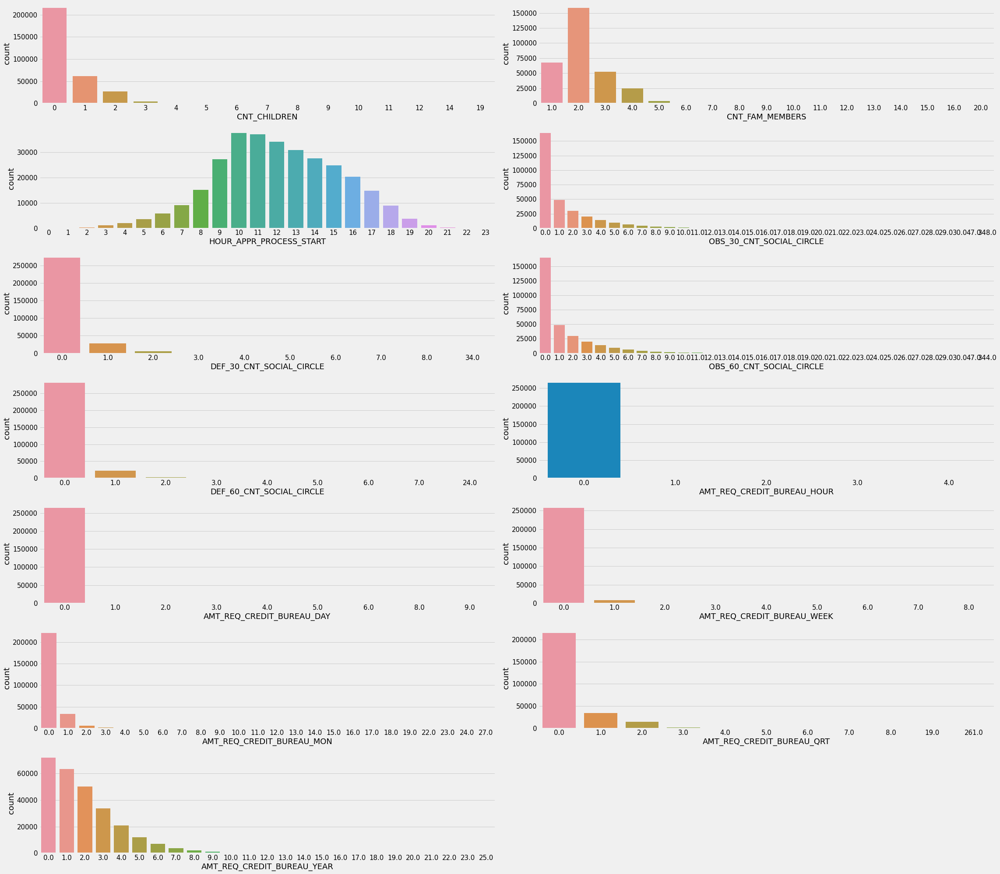

In [14]:
# Some features can't be plotted in subplots. We will show them seperately.
dis_fe_for_subplots=['CNT_CHILDREN','CNT_FAM_MEMBERS','HOUR_APPR_PROCESS_START','OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE','OBS_60_CNT_SOCIAL_CIRCLE','DEF_60_CNT_SOCIAL_CIRCLE','AMT_REQ_CREDIT_BUREAU_HOUR',
 'AMT_REQ_CREDIT_BUREAU_DAY','AMT_REQ_CREDIT_BUREAU_WEEK','AMT_REQ_CREDIT_BUREAU_MON','AMT_REQ_CREDIT_BUREAU_QRT',
 'AMT_REQ_CREDIT_BUREAU_YEAR']

plt.figure(figsize=(32,28))
plotnum=1
for feature in dis_fe_for_subplots:
    if(plotnum<=13):
        ax=plt.subplot(7,2,plotnum) 
        sns.countplot(app_train[feature])
    plotnum+=1
plt.tight_layout() 

> - Most of the clients taking a loan have no children. The number of loans associated with the clients with one children are 4 times smaller, the number of loans associated with the clients with two children are 8 times smaller; clients with 3, 4 or more children are much more rare.
> - Clients with family members of 2 are most numerous, followed by 1 (single persons), 3 (families with one child) and 4.
> - Clients registered their application at mostly peak hours usually between 10-12 AM.
> - There wasnt much observations of clients social surroundings.
> - Number of enquiries to credit bureau about the client was minimal every time.

<AxesSubplot:xlabel='DAYS_BIRTH', ylabel='Density'>

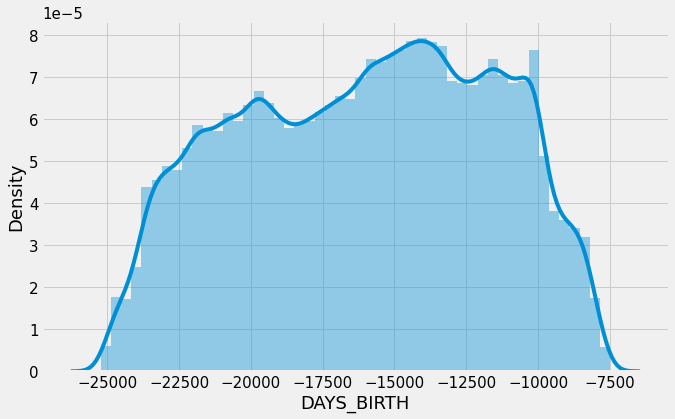

In [15]:
sns.distplot(app_train['DAYS_BIRTH'])

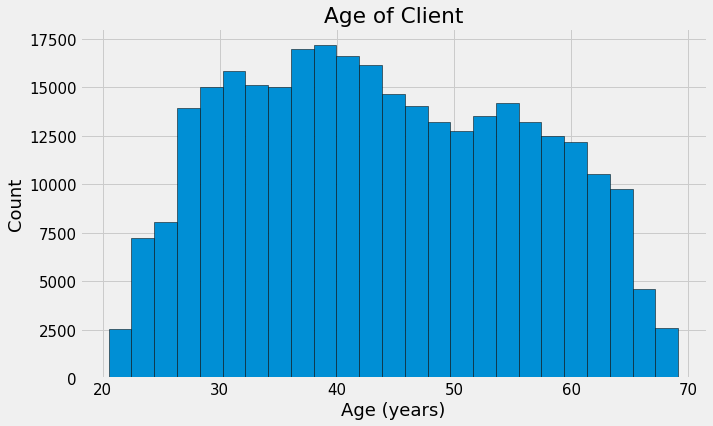

In [16]:
# Showing Postive of Age in years
plt.hist(app_train['DAYS_BIRTH'] / -365, edgecolor = 'k', bins = 25)
plt.title('Age of Client'); plt.xlabel('Age (years)'); plt.ylabel('Count');

> Age is Normally distributed. No outliers present. Age range are mostly clustered around 35-50 years.

<AxesSubplot:xlabel='DAYS_EMPLOYED', ylabel='Density'>

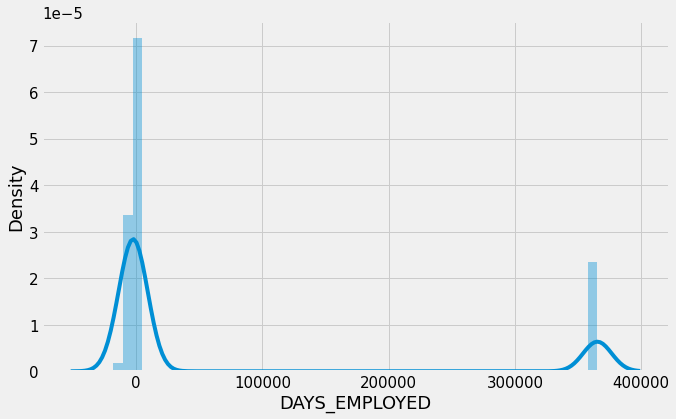

In [17]:
sns.distplot(app_train['DAYS_EMPLOYED'])

In [18]:
app_train['DAYS_EMPLOYED'].describe()

count    307511.000000
mean      63815.045904
std      141275.766519
min      -17912.000000
25%       -2760.000000
50%       -1213.000000
75%        -289.000000
max      365243.000000
Name: DAYS_EMPLOYED, dtype: float64

> That doesn't look right! The maximum value (besides being positive) is about 1000 years!.Just out of curiousity, let's subset the anomalous clients and see if they tend to have higher or low rates of default than the rest of the clients.

In [19]:
# Create a anomalous dataframe
anom = app_train[app_train['DAYS_EMPLOYED'] == 365243]
non_anom = app_train[app_train['DAYS_EMPLOYED'] != 365243]
print('The non-anomalies default on %0.2f%% of loans' % (100 * non_anom['TARGET'].mean()))
print('The anomalies default on %0.2f%% of loans' % (100 * anom['TARGET'].mean()))
print('There are %d anomalous days of employment' % len(anom))

The non-anomalies default on 8.66% of loans
The anomalies default on 5.40% of loans
There are 55374 anomalous days of employment


> - Well that is extremely interesting! It turns out that the anomalies have a lower rate of default.
> - Handling the anomalies depends on the exact situation, with no set rules. One of the safest approaches is just to set the anomalies to a missing value and then have them filled in (using Imputation) before machine learning. In this case, since all the anomalies have the exact same value, we want to fill them in with the same value in case all of these loans share something in common. The anomalous values seem to have some importance. As a solution, we will fill in the anomalous values with not a number (np.nan) and then impute it in FE Section.

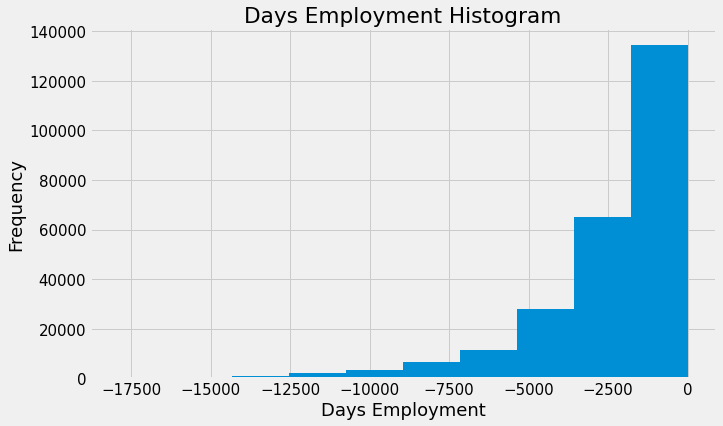

In [20]:
# Create an anomalous flag column
data=app_train.copy()
data['DAYS_EMPLOYED_ANOM'] = data["DAYS_EMPLOYED"] == 365243

# Replace the anomalous values with nan
data['DAYS_EMPLOYED'].replace({365243: np.nan}, inplace = True)

data['DAYS_EMPLOYED'].plot.hist(title = 'Days Employment Histogram');
plt.xlabel('Days Employment');

> The distribution looks to be much more in line with what we would. Becuase we have filled in with nans we will need to impute with some value, probably the median of the column.

<AxesSubplot:xlabel='DAYS_ID_PUBLISH', ylabel='Density'>

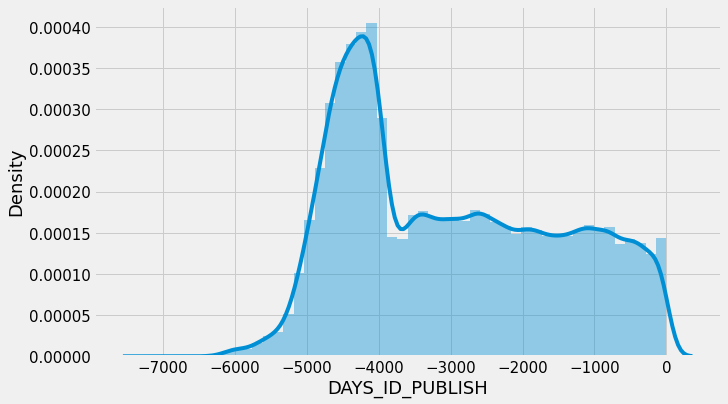

In [21]:
sns.distplot(app_train['DAYS_ID_PUBLISH'])

<AxesSubplot:xlabel='DAYS_REGISTRATION', ylabel='Density'>

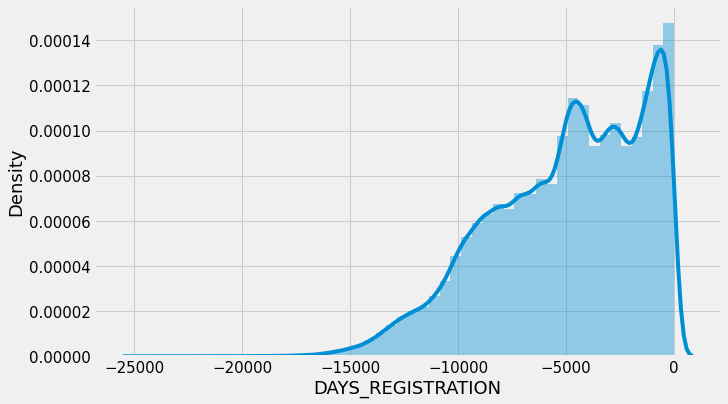

In [22]:
sns.distplot(app_train['DAYS_REGISTRATION'])

<AxesSubplot:xlabel='OWN_CAR_AGE', ylabel='Density'>

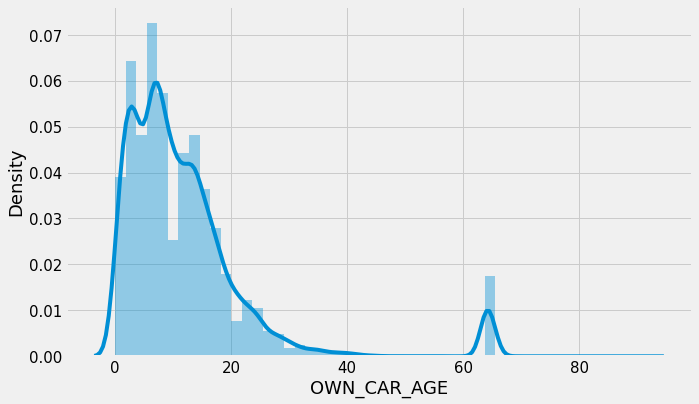

In [23]:
sns.distplot(app_train['OWN_CAR_AGE'])

<AxesSubplot:xlabel='DAYS_LAST_PHONE_CHANGE', ylabel='Density'>

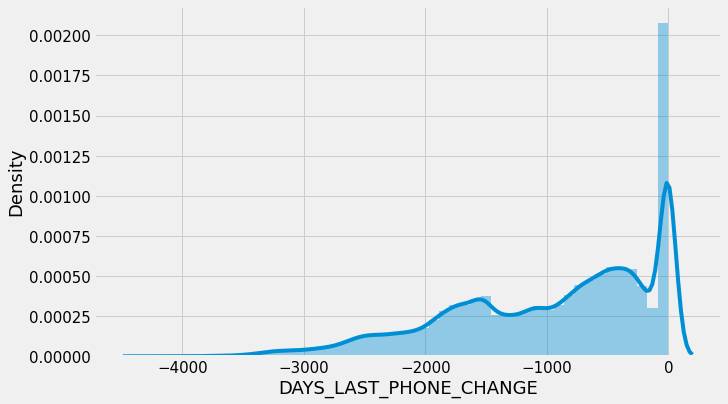

In [24]:
sns.distplot(app_train['DAYS_LAST_PHONE_CHANGE'])

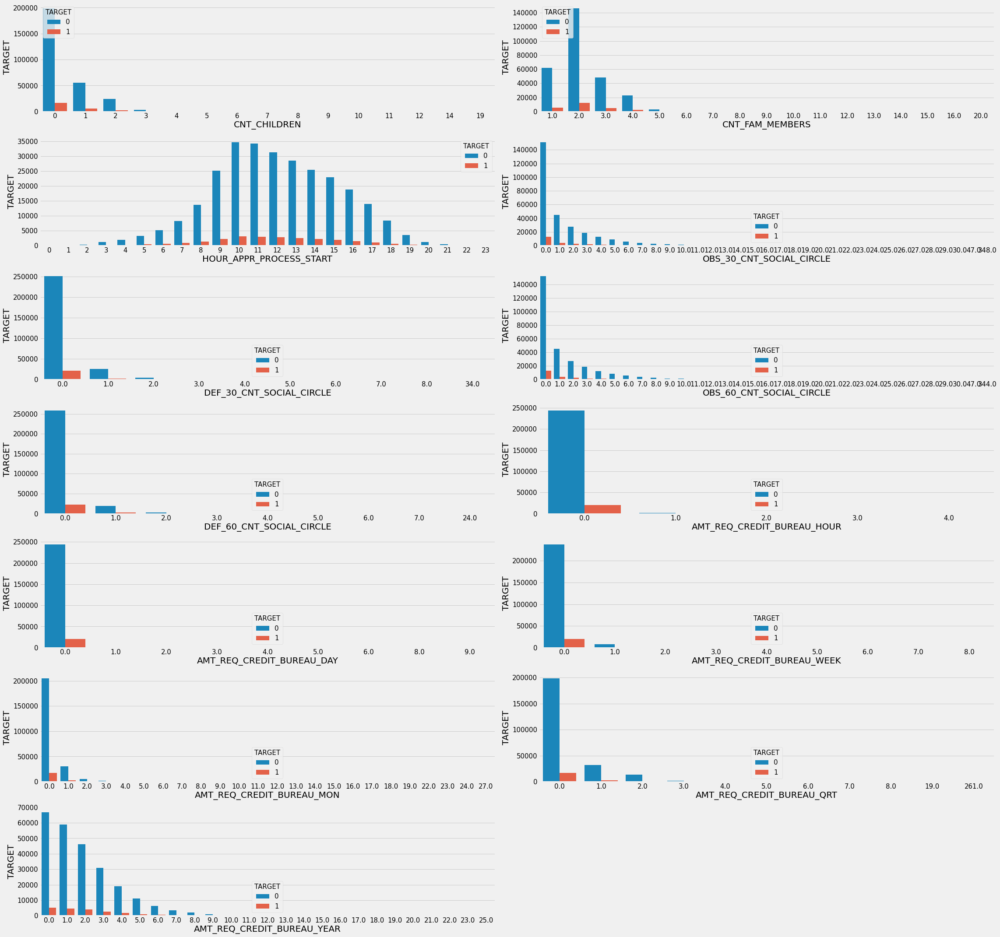

In [25]:
# Bivariate Analysis : 

plt.figure(figsize=(32,30))
plotnumber = 1

for column in dis_fe_for_subplots:
    if plotnumber<=13 :
        ax = plt.subplot(7,2,plotnumber)
        sns.countplot(x=app_train[column].dropna(axis=0)
                        ,hue=app_train.TARGET)
        plt.xlabel(column,fontsize=20)
        plt.ylabel('TARGET',fontsize=20)
    plotnumber+=1
plt.tight_layout()

> - As for repayment, clients with no children, 1, 2, 3, and 5 children have percents of no repayment around the average. The clients with 4 and 6 children are above average in terms of percent of not paid back loans.
> - As for clients with 9 or 11 children, the percent of loans not repaid is 100%.
> - Clients with family size of 11 and 13 have 100% not repayment rate. 
> - Most replayed loans that filed applications during peak hours.
> - There is a lot of loan repayed back, so most probably they never went to enquire credit bureau about client

<AxesSubplot:xlabel='DAYS_BIRTH', ylabel='Density'>

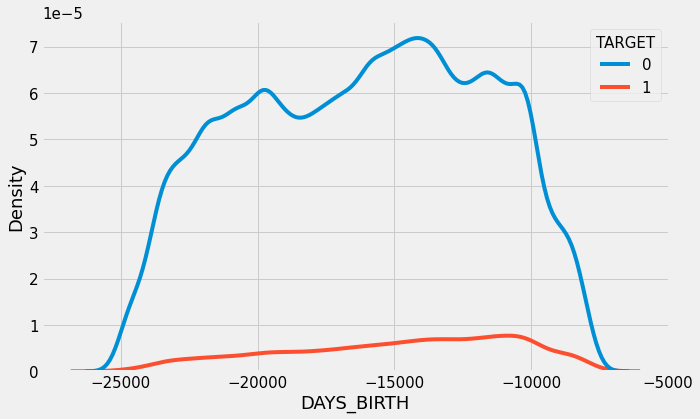

In [26]:
sns.kdeplot(app_train['DAYS_BIRTH'],hue=app_train.TARGET)

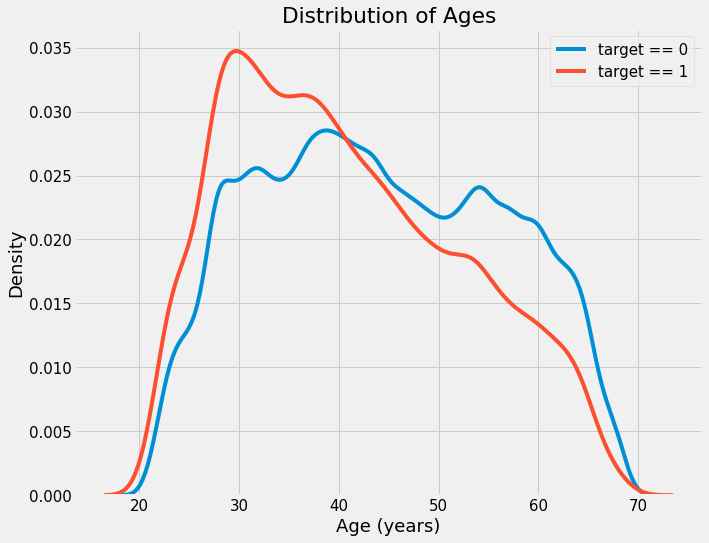

In [27]:
#plt.style.use('fivethirtyeight')
plt.figure(figsize = (10, 8))

# KDE plot of loans that were repaid on time
sns.kdeplot(app_train.loc[app_train['TARGET'] == 0, 'DAYS_BIRTH'] / -365,label = 'target == 0')

# KDE plot of loans which were not repaid on time
sns.kdeplot(app_train.loc[app_train['TARGET'] == 1, 'DAYS_BIRTH'] / -365,label = 'target == 1')

# Labeling of plot
plt.xlabel('Age (years)'); plt.ylabel('Density'); plt.title('Distribution of Ages');
plt.legend()

> The target == 1 curve skews towards the younger end of the range. 

<AxesSubplot:xlabel='DAYS_EMPLOYED', ylabel='Density'>

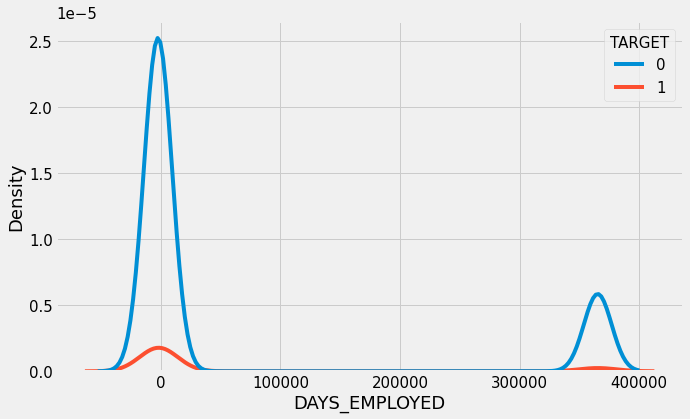

In [28]:
sns.kdeplot(app_train['DAYS_EMPLOYED'],hue=app_train.TARGET)

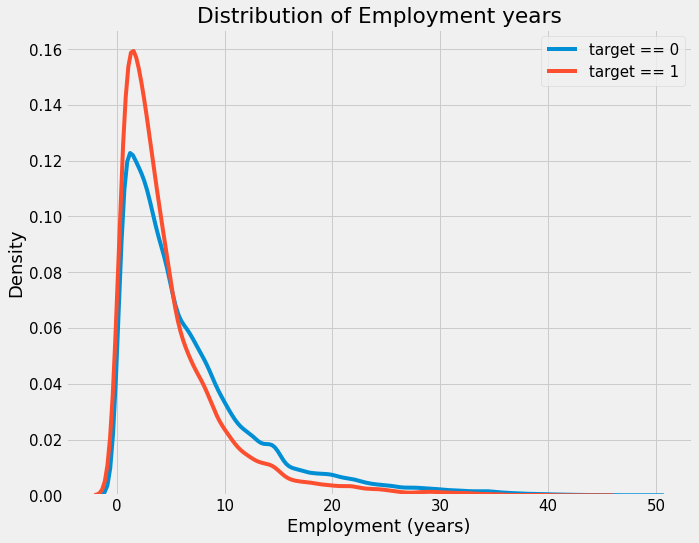

In [29]:
# Create an anomalous flag column
data=app_train.copy()
data['DAYS_EMPLOYED_ANOM'] = data["DAYS_EMPLOYED"] == 365243

data['DAYS_EMPLOYED'].replace({365243: np.nan}, inplace = True)

plt.figure(figsize = (10, 8))

sns.kdeplot(data.loc[data['TARGET'] == 0, 'DAYS_EMPLOYED'] / -365,label = 'target == 0')

sns.kdeplot(data.loc[data['TARGET'] == 1, 'DAYS_EMPLOYED'] / -365,label = 'target == 1')

plt.xlabel('Employment (years)'); plt.ylabel('Density'); plt.title('Distribution of Employment years');
plt.legend()

> As Age increases, Employment years also increase. As we saw from the age trend, those whose employment years between 0-5 are more likely to default.

<AxesSubplot:xlabel='DAYS_ID_PUBLISH', ylabel='Density'>

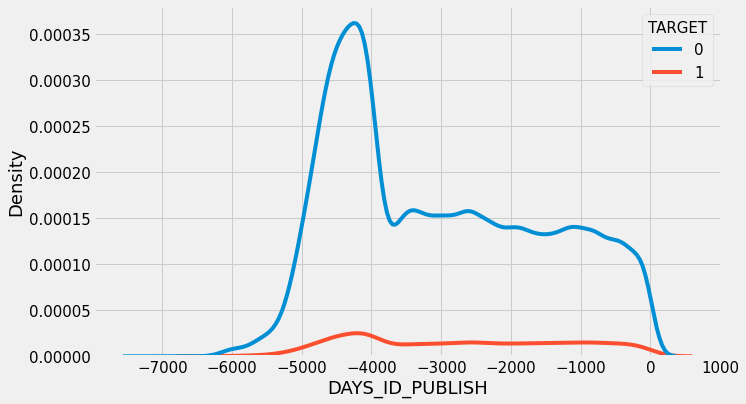

In [30]:
sns.kdeplot(app_train['DAYS_ID_PUBLISH'],hue=app_train.TARGET)

<AxesSubplot:xlabel='DAYS_REGISTRATION', ylabel='Density'>

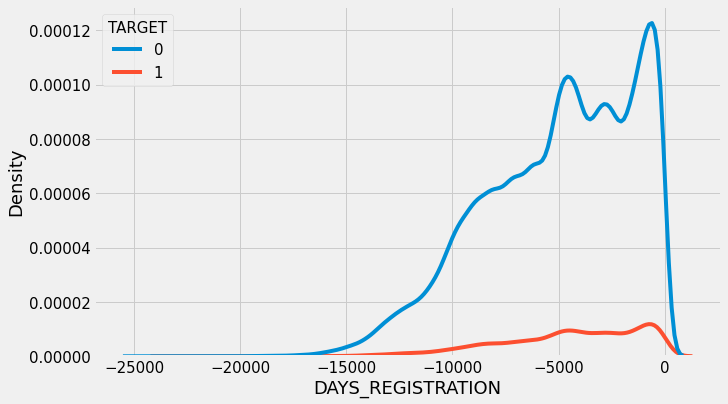

In [31]:
sns.kdeplot(app_train['DAYS_REGISTRATION'],hue=app_train.TARGET)

<AxesSubplot:xlabel='OWN_CAR_AGE', ylabel='Density'>

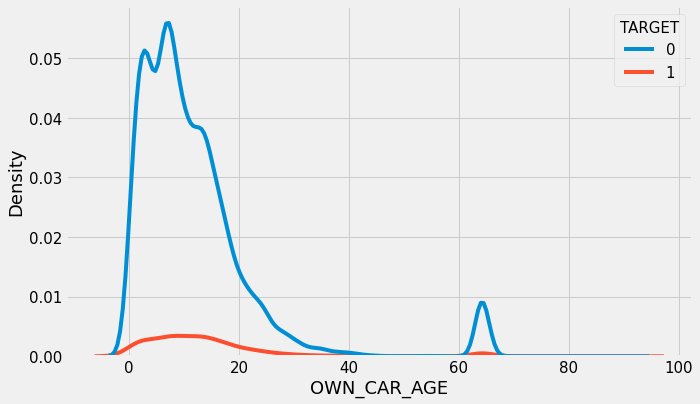

In [32]:
sns.kdeplot(app_train['OWN_CAR_AGE'],hue=app_train.TARGET)

<AxesSubplot:xlabel='DAYS_LAST_PHONE_CHANGE', ylabel='Density'>

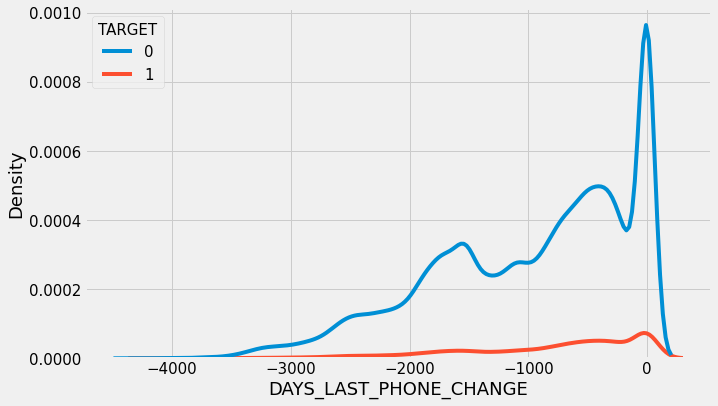

In [33]:
sns.kdeplot(app_train['DAYS_LAST_PHONE_CHANGE'],hue=app_train.TARGET)

# 2.7 Continuous Features

In [34]:
conti_fe_app_train_unfiltered=[feature for feature in num_fe_app_train if feature not in dis_fe_app_train]
conti_fe_app_train=[feature for feature in conti_fe_app_train_unfiltered if feature not in remove_cols]
conti_fe_app_train

['AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'REGION_POPULATION_RELATIVE',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_AVG',
 'YEARS_BUILD_AVG',
 'COMMONAREA_AVG',
 'ELEVATORS_AVG',
 'ENTRANCES_AVG',
 'FLOORSMAX_AVG',
 'FLOORSMIN_AVG',
 'LANDAREA_AVG',
 'LIVINGAPARTMENTS_AVG',
 'LIVINGAREA_AVG',
 'NONLIVINGAPARTMENTS_AVG',
 'NONLIVINGAREA_AVG',
 'APARTMENTS_MODE',
 'BASEMENTAREA_MODE',
 'YEARS_BEGINEXPLUATATION_MODE',
 'YEARS_BUILD_MODE',
 'COMMONAREA_MODE',
 'ELEVATORS_MODE',
 'ENTRANCES_MODE',
 'FLOORSMAX_MODE',
 'FLOORSMIN_MODE',
 'LANDAREA_MODE',
 'LIVINGAPARTMENTS_MODE',
 'LIVINGAREA_MODE',
 'NONLIVINGAPARTMENTS_MODE',
 'NONLIVINGAREA_MODE',
 'APARTMENTS_MEDI',
 'BASEMENTAREA_MEDI',
 'YEARS_BEGINEXPLUATATION_MEDI',
 'YEARS_BUILD_MEDI',
 'COMMONAREA_MEDI',
 'ELEVATORS_MEDI',
 'ENTRANCES_MEDI',
 'FLOORSMAX_MEDI',
 'FLOORSMIN_MEDI',
 'LANDAREA_MEDI',
 'LIVINGAPARTMENTS_MEDI',
 'LIVING

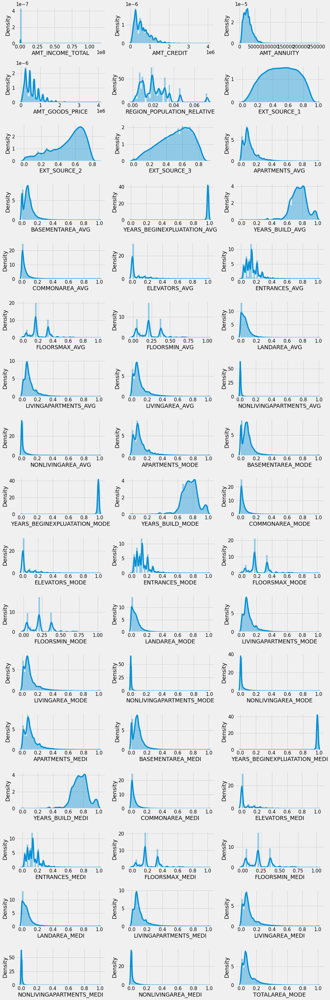

In [35]:
# Univariate Analysis :

plt.figure(figsize=(15,45))
plotnum=1
for feature in conti_fe_app_train:
    if(plotnum<=len(conti_fe_app_train)):
        ax=plt.subplot(17,3,plotnum) 
        sns.distplot(app_train[feature])
    plotnum+=1
plt.tight_layout()  

> - AMT_INCOME_TOTAL is the income of the client.
The income of both types of clients is less than 20000000 except for one client who has an income of 117000000.
> - For AMT Credit and AMT goodsprice the graphs look right-skewed.
> - External Source 1 seems to be normally distributed. Can be handy for Model.
> - Only a few parameters of Clients apartment are going to affect the model.

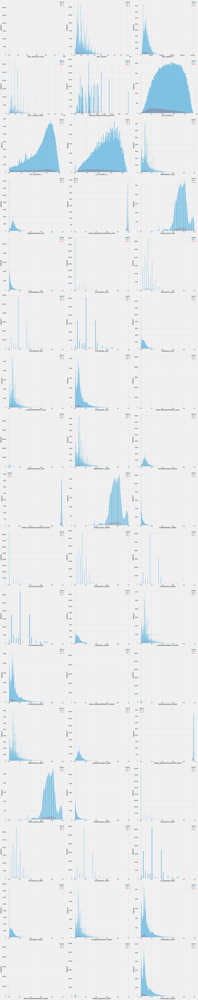

In [36]:
# bivariate analysis

plt.figure(figsize=(35,175))
plotnumber = 1

for column in conti_fe_app_train:
    if plotnumber<=len(conti_fe_app_train) :
        ax = plt.subplot(17,3,plotnumber)
        sns.histplot(x=app_train[column].dropna(axis=0)
                        ,hue=app_train.TARGET)
        plt.xlabel(column,fontsize=20)
        plt.ylabel('TARGET',fontsize=20)
    plotnumber+=1
plt.tight_layout()

> - AMT Credit:
The density is high for the amount less than 10⁶ for both types of applicants who can pay and have difficulty in paying loans.
The graph looks right-skewed.
It is clear that the data is highly overlapping between the people who are able to pay loan on time and the people who had difficulty in paying loan back.
> - AMT_INCOME_TOTAL is the income of the client.
The income of both types of clients is less than 20000000 except for one client who has an income of 117000000 and still is not able to pay the loan.
> - External source 1 < 0.4 then the client will default and External source 1 > 0.4 client will repay, there is a visible separation between two classes.
External source 2 < 0.5 then the client will default and External source 2> 0.5 client will repay, there is a visible separation between two classes.
External source 3< 0.4 then the client will default and External source 3 > 0.4 client will repay, there is a visible separation between two classes.
EXT_SOURCE_1, EXT_SOURCE_2, EXT_SOURCE_3 these features are very useful

# 2.8 Categorical Features

In [37]:
cat_fe_app_train=[feature for feature in app_train.columns if app_train[feature].dtype=='O']
print('The no. of Categorical features in app_train is : ',len(cat_fe_app_train))
print('The Categorical features in app_train is : \n',cat_fe_app_train)

The no. of Categorical features in app_train is :  16
The Categorical features in app_train is : 
 ['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'FONDKAPREMONT_MODE', 'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE']


## Number of Unique categories in each feature

In [38]:
for feature in cat_fe_app_train:
    print('The no. of unique categories in {} feature of app_train is : {}'.format(feature,app_train[feature].nunique()))

The no. of unique categories in NAME_CONTRACT_TYPE feature of app_train is : 2
The no. of unique categories in CODE_GENDER feature of app_train is : 3
The no. of unique categories in FLAG_OWN_CAR feature of app_train is : 2
The no. of unique categories in FLAG_OWN_REALTY feature of app_train is : 2
The no. of unique categories in NAME_TYPE_SUITE feature of app_train is : 7
The no. of unique categories in NAME_INCOME_TYPE feature of app_train is : 8
The no. of unique categories in NAME_EDUCATION_TYPE feature of app_train is : 5
The no. of unique categories in NAME_FAMILY_STATUS feature of app_train is : 6
The no. of unique categories in NAME_HOUSING_TYPE feature of app_train is : 6
The no. of unique categories in OCCUPATION_TYPE feature of app_train is : 18
The no. of unique categories in WEEKDAY_APPR_PROCESS_START feature of app_train is : 7
The no. of unique categories in ORGANIZATION_TYPE feature of app_train is : 58
The no. of unique categories in FONDKAPREMONT_MODE feature of app_t

> Most of the categorical variables have a relatively small number of unique entries. We will need to find a way to deal with these categorical variables!

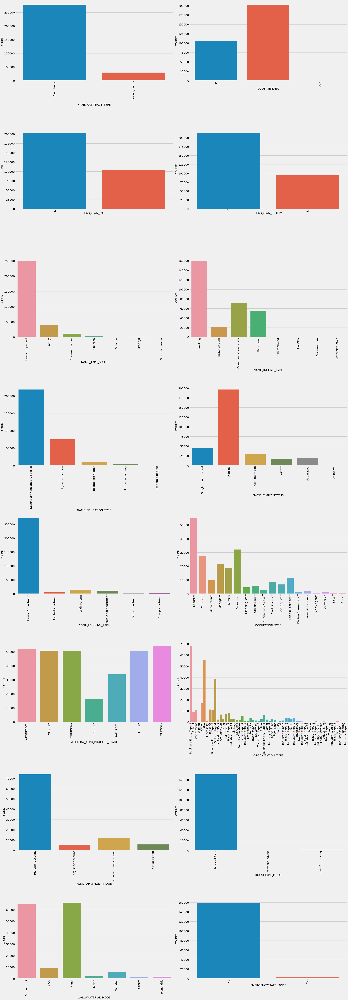

In [39]:
# Univariate Analysis

plt.figure(figsize=(35,100))
plotnum=1
for feature in cat_fe_app_train:
    if(plotnum<=len(cat_fe_app_train)): 
        ax=plt.subplot(8,2,plotnum) 
        sns.countplot(app_train[feature])
        plt.xlabel(feature,fontsize=20) 
        plt.ylabel('COUNT',fontsize=20)
        plt.xticks(fontsize=20,rotation=90)
        plt.yticks(fontsize=20)
    plotnum+=1
plt.tight_layout()  

> - We can see that there are two types of contract - cash loans and revolving loans.
> - The number of female clients is almost double the number of male clients.
> - The clients that owns a car are almost a half of the ones that doesn't own one.
> - The clients that owns real estate are more than double of the ones that doesn't own.
> - It is quite interesting that unemployed/students have quite a high income. And of course, most of the people work.
> - Most of clients are married, followed by Single/not married and civil marriage.
> - We can see that most of the people who are married and have zero children
> - Most of applicants for loans are income from Working, followed by Commercial associate, Pensioner and State servant.
> - Most of the loans are taken by Laborers, followed by Sales staff. IT staff take the lowest amount of loans.
> - Majority of the clients have Secondary / secondary special education, followed by clients with Higher education. Only a very small number having an academic degree.
> - Over 250,000 applicants for credits registered their housing as House/apartment. Following categories have a very small number of clients (With parents, Municipal appartment).

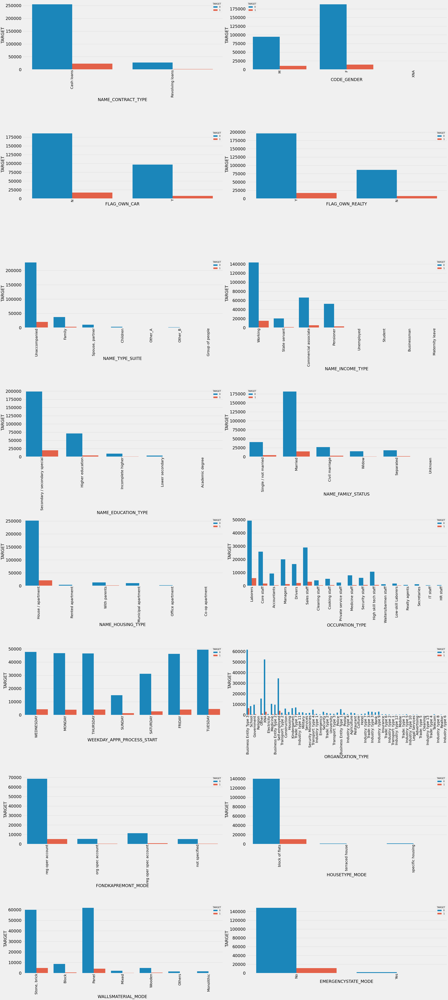

In [40]:
# Bivariate Analysis

plt.figure(figsize=(45,100))
plotnumber = 1

for column in cat_fe_app_train:
    if plotnumber<=len(cat_fe_app_train):
        ax = plt.subplot(8,2,plotnumber)
        sns.countplot(x=app_train[column].dropna(axis=0)
                        ,hue=app_train.TARGET)
        plt.xlabel(column,fontsize=30) 
        plt.ylabel('TARGET',fontsize=30)
        plt.xticks(fontsize=25,rotation=90)
        plt.yticks(fontsize=30)
    plotnumber+=1
plt.tight_layout()

> - Most of the loans are cash loans which are defaulted.
> - We can see that women take more loans and higher percentage of them repays the loans. And there are 4 people with unindentified gender, who repayed their loans.  Males have a higher chance of not returning their loans, comparing with women. 
> - The clients that owns a car are less likely to not repay a loan that the ones that own. 
> - In terms of percentage of not repayment of loan, Civil marriage has the highest percent of non repayment, with Widow the lowest (exception being Unknown).
> - The category with highest percent of not repaid loans are Low-skill Laborers, followed by Drivers and Waiters/barmen staff, Security staff, Laborers and Cooking staff.
> - The Lower secondary category, although rare, have the largest rate of not returning the loan. The people with Academic degree have very less non-repayment rate.
> - Rented apartment and with parents have highest non-repayment rate.

## Analysis of few Numerical variables which are actually Categorical

<font color='chocolate'>We will keep this Numerical for now for our Analysis. We do need to remember that now our no. of categorical features are actually `16+34=50` </font>

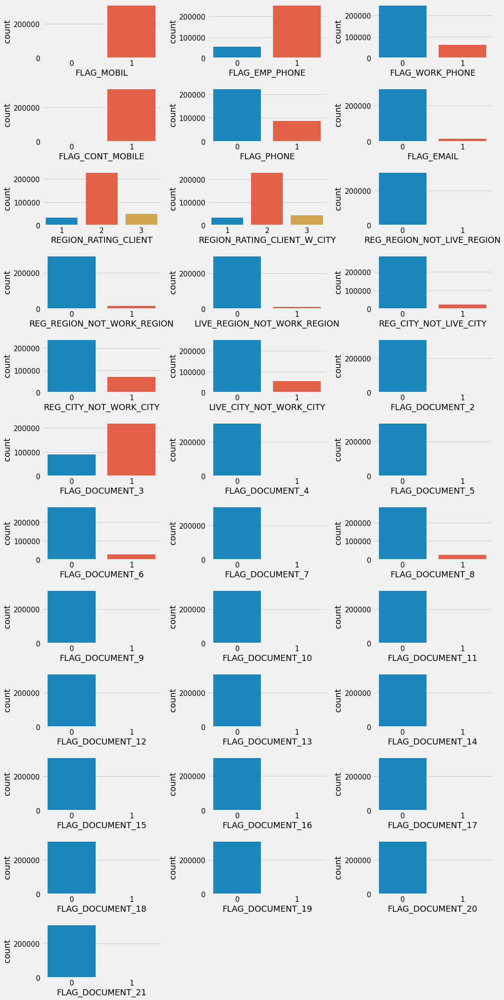

In [41]:
# Univariate Analysis

plt.figure(figsize=(15,30))
plotnum=1
for feature in remove_cols:
    if(plotnum<=len(remove_cols)): 
        ax=plt.subplot(12,3,plotnum) 
        sns.countplot(app_train[feature])
    plotnum+=1
plt.tight_layout() 

> - Very few people are registered in not live or not work region.
> - Generally, much more people register in the city they live or work (a larger number register differently in the working city than living city).
> - Both types of clients mostly submit only 1 document which is document 3.
DOCUMENT_3 is the most common document submitted by the applicants.
FLAG_DOCUMENT_3 is mostly submitted by the clients who can repay the loan and not submitted by the clients who cannot repay the loan but this could be also possible because the data is imbalanced.

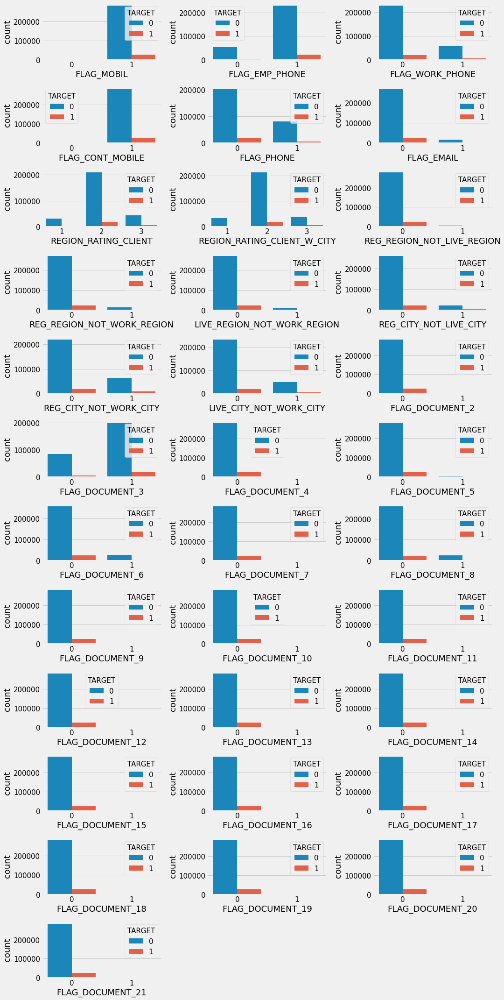

In [42]:
# Bivariate Analysis

plt.figure(figsize=(15,30))
plotnum=1
for feature in remove_cols:
    if(plotnum<=len(remove_cols)): 
        ax=plt.subplot(12,3,plotnum) 
        sns.countplot(app_train[feature].dropna(axis=0),hue=app_train.TARGET)
    plotnum+=1
plt.tight_layout()

> - Very few people are registered in not live or not work region. Generally, the rate of not return is slightly larger for these cases than in the rest.
> - Whatever has been flagged, it may be phone, email address,documents most of them have repayed loans back.

# 2.9 Skewness and Kurtosis

In [43]:
for feature in num_fe_app_train:
    print('{:15}'.format(feature), 
          'Skewness: {:05.2f}'.format(app_train[feature].skew()) , 
          '   ' ,
          'Kurtosis: {:06.2f}'.format(app_train[feature].kurt())  
         )

CNT_CHILDREN    Skewness: 01.97     Kurtosis: 007.90
AMT_INCOME_TOTAL Skewness: 391.56     Kurtosis: 191786.55
AMT_CREDIT      Skewness: 01.23     Kurtosis: 001.93
AMT_ANNUITY     Skewness: 01.58     Kurtosis: 007.71
AMT_GOODS_PRICE Skewness: 01.35     Kurtosis: 002.43
REGION_POPULATION_RELATIVE Skewness: 01.49     Kurtosis: 003.26
DAYS_BIRTH      Skewness: -0.12     Kurtosis: -01.05
DAYS_EMPLOYED   Skewness: 01.66     Kurtosis: 000.77
DAYS_REGISTRATION Skewness: -0.59     Kurtosis: -00.32
DAYS_ID_PUBLISH Skewness: 00.35     Kurtosis: -01.11
OWN_CAR_AGE     Skewness: 02.75     Kurtosis: 009.21
FLAG_MOBIL      Skewness: -554.54     Kurtosis: 307511.00
FLAG_EMP_PHONE  Skewness: -1.66     Kurtosis: 000.77
FLAG_WORK_PHONE Skewness: 01.50     Kurtosis: 000.26
FLAG_CONT_MOBILE Skewness: -23.08     Kurtosis: 530.74
FLAG_PHONE      Skewness: 00.97     Kurtosis: -01.05
FLAG_EMAIL      Skewness: 03.83     Kurtosis: 012.69
CNT_FAM_MEMBERS Skewness: 00.99     Kurtosis: 002.80
REGION_RATING_CLIENT 

# 2.10 Outliers

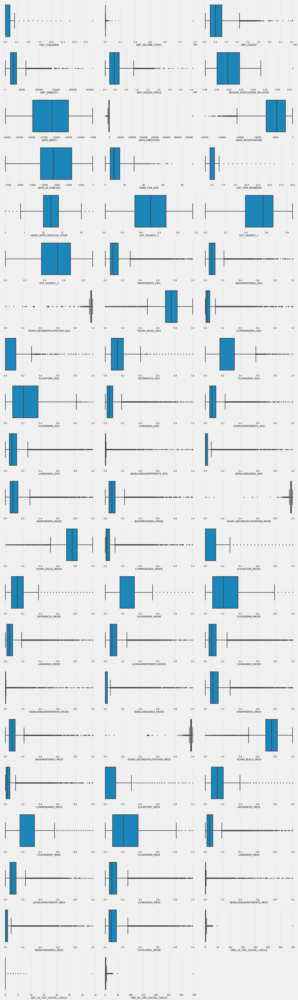

In [44]:
plt.figure(figsize=(30,100))
plotnum=1
for feature in num_fe_app_train:
    if feature not in remove_cols:
           if(plotnum<=62):
                ax=plt.subplot(21,3,plotnum) 
                sns.boxplot(app_train[feature])
                plotnum+=1
plt.tight_layout()  

> There are outliers present. We will deal with them in the FE Section.

# 2.11 Heatmap

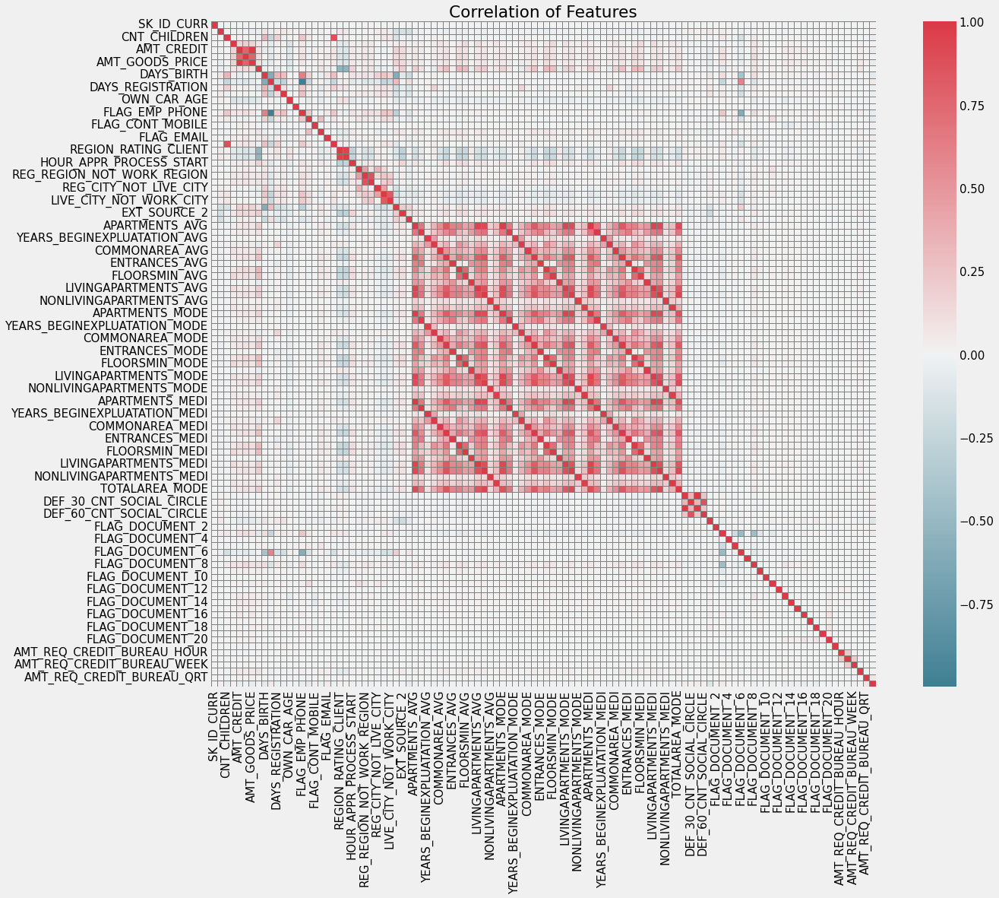

In [45]:
def correlation_heatmap(df):
    fig , ax = plt.subplots(figsize =(20,15))
    colormap = sns.diverging_palette(220, 10, as_cmap = True)
    
    fig = sns.heatmap(
        df.corr(), 
        cmap = colormap,
        square=True, linewidths=.5,linecolor='grey'
    )
    
    plt.title('Correlation of Features')

correlation_heatmap(app_train)

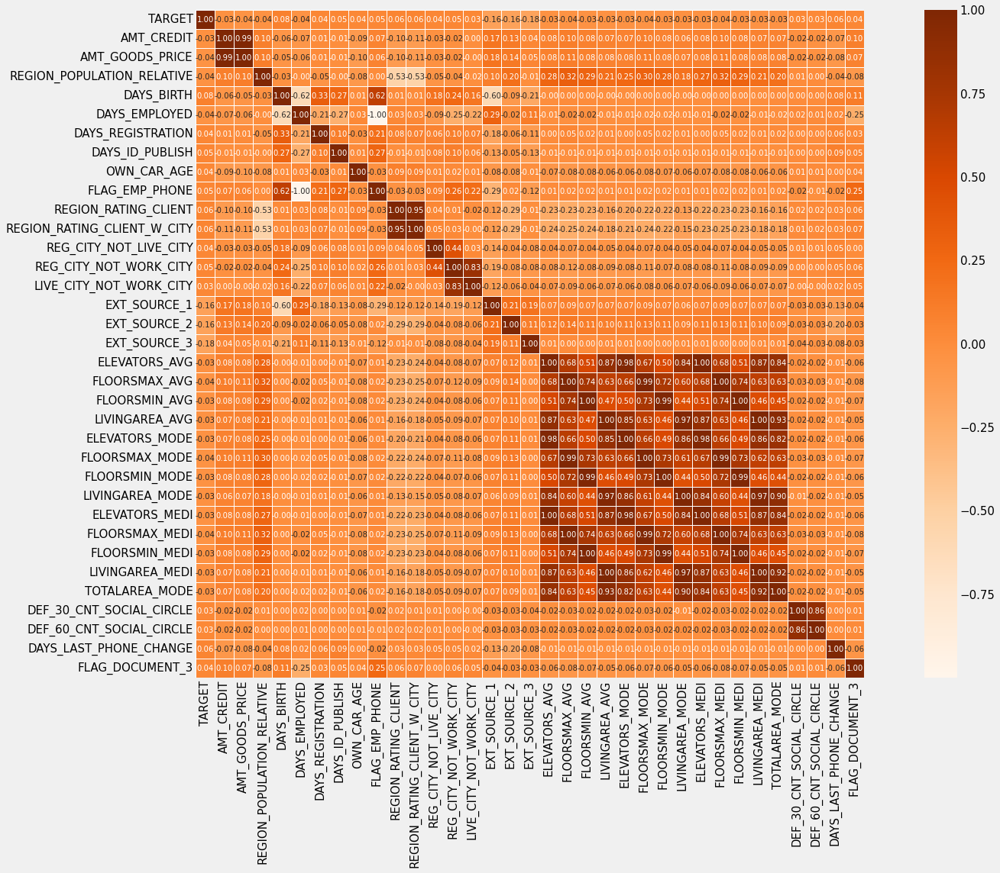

In [46]:
# most correlated features
# Corr of 0.03 taken here because the highest corr with Target is only 0.17
corrmat = app_train.corr()
top_corr_features = corrmat.index[abs(corrmat["TARGET"])>=0.03]
plt.figure(figsize=(25,15))
g = sns.heatmap(app_train[top_corr_features].corr(),annot=True,cmap="Oranges", square=True, linewidths=.5, fmt='.2f',annot_kws={'size': 10})

# 2.12 Correlation with Target Variable

In [47]:
app_train_corr = app_train.corr()['TARGET'].sort_values(ascending=False)

print('Most Positive Correlations:\n', app_train_corr.head(15))
print('\nMost Negative Correlations:\n', app_train_corr.tail(15).sort_values(ascending=True))

Most Positive Correlations:
 TARGET                         1.000000
DAYS_BIRTH                     0.078239
REGION_RATING_CLIENT_W_CITY    0.060893
REGION_RATING_CLIENT           0.058899
DAYS_LAST_PHONE_CHANGE         0.055218
DAYS_ID_PUBLISH                0.051457
REG_CITY_NOT_WORK_CITY         0.050994
FLAG_EMP_PHONE                 0.045982
REG_CITY_NOT_LIVE_CITY         0.044395
FLAG_DOCUMENT_3                0.044346
DAYS_REGISTRATION              0.041975
OWN_CAR_AGE                    0.037612
LIVE_CITY_NOT_WORK_CITY        0.032518
DEF_30_CNT_SOCIAL_CIRCLE       0.032248
DEF_60_CNT_SOCIAL_CIRCLE       0.031276
Name: TARGET, dtype: float64

Most Negative Correlations:
 EXT_SOURCE_3                 -0.178919
EXT_SOURCE_2                 -0.160472
EXT_SOURCE_1                 -0.155317
DAYS_EMPLOYED                -0.044932
FLOORSMAX_AVG                -0.044003
FLOORSMAX_MEDI               -0.043768
FLOORSMAX_MODE               -0.043226
AMT_GOODS_PRICE              -0.039645


# 2.13 Multicollinearity

In [48]:
correlations=app_train.corr()
attrs = correlations.iloc[2:,2:] # all except target

threshold = 0.5
important_corrs = (attrs[abs(attrs) > threshold][attrs != 1.0]).unstack().dropna().to_dict()

unique_important_corrs=pd.DataFrame(important_corrs.items(),columns=['Attribute Pair', 'Correlation'])
multi_corr=unique_important_corrs.sort_values(by=['Correlation'],ascending = False,ignore_index= True)
multi_corr.iloc[::2]

,Attribute Pair,Correlation
0,"(YEARS_BUILD_AVG, YEARS_BUILD_MEDI)",0.998495
2,"(OBS_60_CNT_SOCIAL_CIRCLE, OBS_30_CNT_SOCIAL_C...",0.998490
4,"(FLOORSMIN_MEDI, FLOORSMIN_AVG)",0.997241
6,"(FLOORSMAX_MEDI, FLOORSMAX_AVG)",0.997034
8,"(ENTRANCES_AVG, ENTRANCES_MEDI)",0.996886
...,...,...
632,"(REGION_POPULATION_RELATIVE, REGION_RATING_CLI...",-0.532877
634,"(FLAG_DOCUMENT_6, FLAG_EMP_PHONE)",-0.597732
636,"(DAYS_BIRTH, EXT_SOURCE_1)",-0.600610
638,"(DAYS_BIRTH, DAYS_EMPLOYED)",-0.615864


# 3. Bureau Data

In [49]:
bureau=pd.read_csv('bureau.csv')
bureau

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.00,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.00,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.50,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.00,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.00,NaN,NaN,0.0,Consumer credit,-21,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1716423,259355,5057750,Active,currency 1,-44,0,-30.0,NaN,0.0,0,11250.00,11250.0,0.0,0.0,Microloan,-19,NaN
1716424,100044,5057754,Closed,currency 1,-2648,0,-2433.0,-2493.0,5476.5,0,38130.84,0.0,0.0,0.0,Consumer credit,-2493,NaN
1716425,100044,5057762,Closed,currency 1,-1809,0,-1628.0,-970.0,NaN,0,15570.00,NaN,NaN,0.0,Consumer credit,-967,NaN
1716426,246829,5057770,Closed,currency 1,-1878,0,-1513.0,-1513.0,NaN,0,36000.00,0.0,0.0,0.0,Consumer credit,-1508,NaN


# 3.1 Basic Checks 

In [50]:
print('-'*100)
print('Shape of the DataFrame: ',bureau.shape)
print('-'*100)
print('Info of the DataFrame: \n',bureau.info())
print('-'*100)
print('Describe the DataFrame: \n',bureau.describe())
print('-'*100)
print('Describe object types of the DataFrame: \n',bureau.describe(include='O'))
print('-'*100)
print('Datatype of Each Column: \n',bureau.dtypes)
print('-'*100)
print('Duplicated Values: ',bureau.duplicated().sum())
print('-'*100)

----------------------------------------------------------------------------------------------------
Shape of the DataFrame:  (1716428, 17)
----------------------------------------------------------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1716428 entries, 0 to 1716427
Data columns (total 17 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_CURR              int64  
 1   SK_ID_BUREAU            int64  
 2   CREDIT_ACTIVE           object 
 3   CREDIT_CURRENCY         object 
 4   DAYS_CREDIT             int64  
 5   CREDIT_DAY_OVERDUE      int64  
 6   DAYS_CREDIT_ENDDATE     float64
 7   DAYS_ENDDATE_FACT       float64
 8   AMT_CREDIT_MAX_OVERDUE  float64
 9   CNT_CREDIT_PROLONG      int64  
 10  AMT_CREDIT_SUM          float64
 11  AMT_CREDIT_SUM_DEBT     float64
 12  AMT_CREDIT_SUM_LIMIT    float64
 13  AMT_CREDIT_SUM_OVERDUE  float64
 14  CREDIT_TYPE             object 
 15  DAYS_CREDIT_

# 3.2 Missing Values

Your selected dataframe has 17 columns.
There are 7 columns that have missing values.


,Total,Percent
AMT_ANNUITY,1226791,71.473490
AMT_CREDIT_MAX_OVERDUE,1124488,65.513264
DAYS_ENDDATE_FACT,633653,36.916958
AMT_CREDIT_SUM_LIMIT,591780,34.477415
AMT_CREDIT_SUM_DEBT,257669,15.011932
DAYS_CREDIT_ENDDATE,105553,6.149573
AMT_CREDIT_SUM,13,0.000757


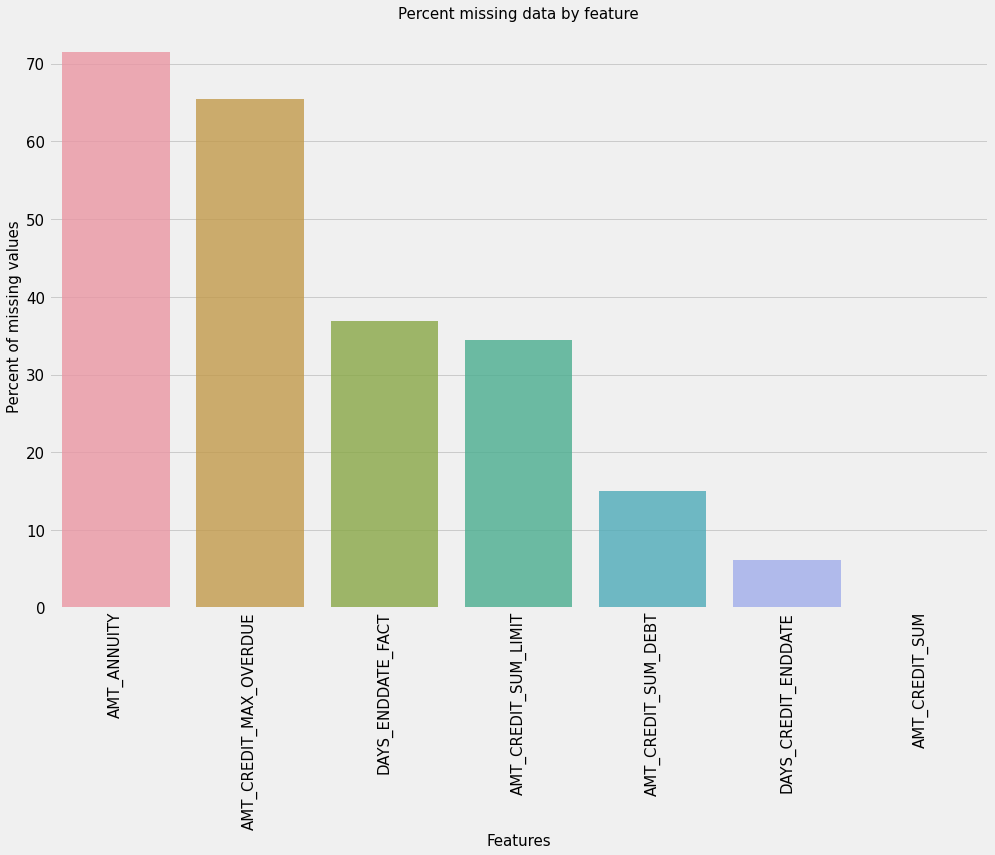

In [51]:
missing_data_bureau = missingdata(bureau)
missing_data_bureau

> There are lot of missing values. We will have to impute them with something meaningful.

# 3.3 Numerical Features

In [52]:
num_fe_bureau=[feature for feature in bureau.columns if bureau[feature].dtype!='O' and feature not in ['SK_ID_CURR','SK_ID_BUREAU']]
print('The no. of Numerical features in bureau is : ',len(num_fe_bureau))
print('The Numerical features in bureau is : \n',num_fe_bureau)

The no. of Numerical features in bureau is :  12
The Numerical features in bureau is : 
 ['DAYS_CREDIT', 'CREDIT_DAY_OVERDUE', 'DAYS_CREDIT_ENDDATE', 'DAYS_ENDDATE_FACT', 'AMT_CREDIT_MAX_OVERDUE', 'CNT_CREDIT_PROLONG', 'AMT_CREDIT_SUM', 'AMT_CREDIT_SUM_DEBT', 'AMT_CREDIT_SUM_LIMIT', 'AMT_CREDIT_SUM_OVERDUE', 'DAYS_CREDIT_UPDATE', 'AMT_ANNUITY']


# 3.4 Discrete Features

In [53]:
dis_fe_bureau=[feature for feature in num_fe_bureau if (bureau[feature].dtype=='int8' or bureau[feature].dtype=='int16' or bureau[feature].dtype=='int64')]
dis_fe_bureau.append('DAYS_CREDIT_ENDDATE')
dis_fe_bureau.append('DAYS_ENDDATE_FACT')
dis_fe_bureau

['DAYS_CREDIT',
 'CREDIT_DAY_OVERDUE',
 'CNT_CREDIT_PROLONG',
 'DAYS_CREDIT_UPDATE',
 'DAYS_CREDIT_ENDDATE',
 'DAYS_ENDDATE_FACT']

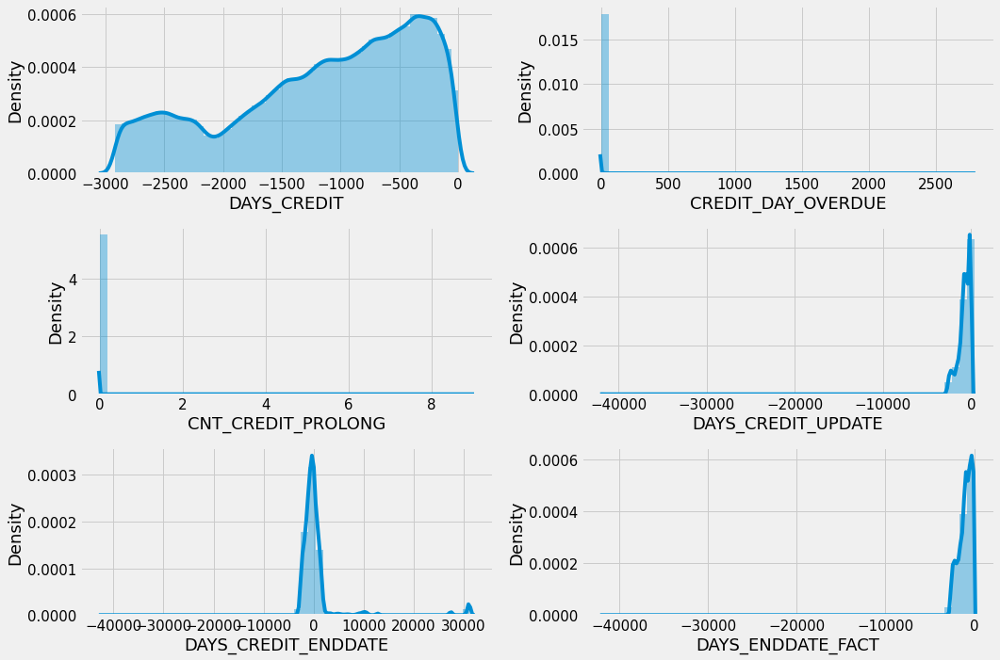

In [54]:
# Univariate Analysis :

plt.figure(figsize=(15,10))
plotnum=1
for feature in dis_fe_bureau:
    if(plotnum<=6):
        ax=plt.subplot(3,2,plotnum) 
        sns.distplot(bureau[feature])
    plotnum+=1
plt.tight_layout()  

> - The credit duration (in days) is ranging between less than 3000 days (with a local sadle around 2000 days) and with a increasing frequence for shorter number of days - and with a peak around 300 days (or less than one year).
> - Most of the credits have 0 or close to 0 days overdue. The maximum number of credit days overdue is ~3000 days.
> - Days of remaining credit bureau credit are close to to -2500 to 0 days.

# 3.5 Continuous Features

In [55]:
conti_fe_bureau=[feature for feature in num_fe_bureau if feature not in dis_fe_bureau]
conti_fe_bureau

['AMT_CREDIT_MAX_OVERDUE',
 'AMT_CREDIT_SUM',
 'AMT_CREDIT_SUM_DEBT',
 'AMT_CREDIT_SUM_LIMIT',
 'AMT_CREDIT_SUM_OVERDUE',
 'AMT_ANNUITY']

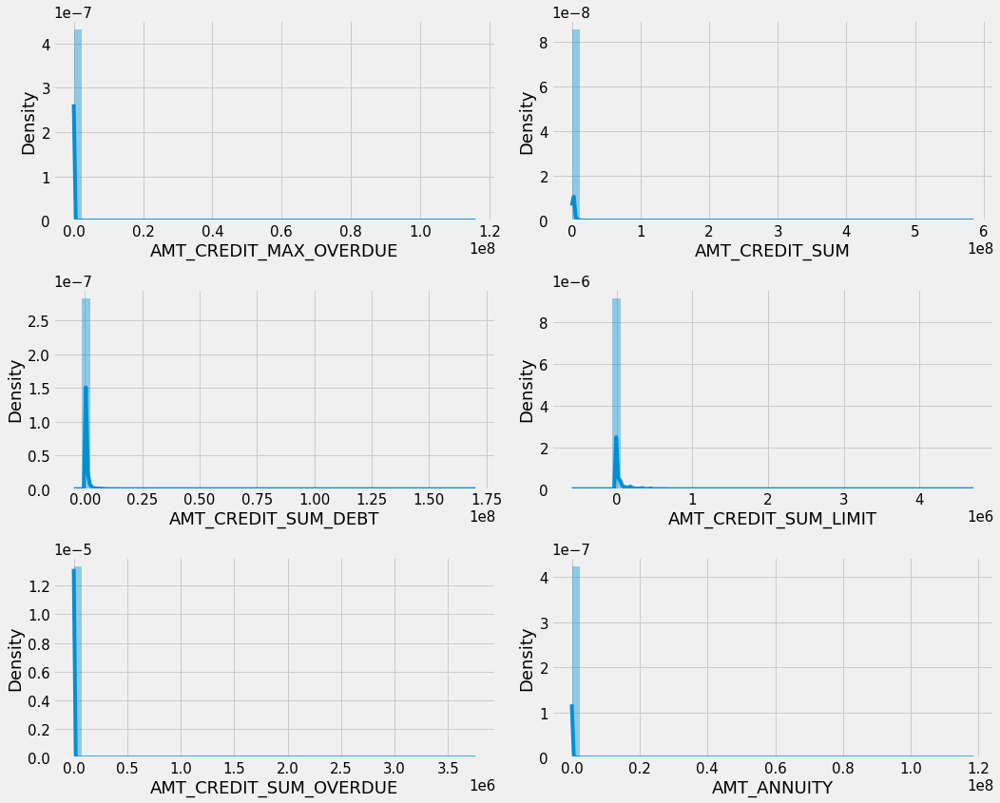

In [56]:
# Univariate Analysis :

plt.figure(figsize=(15,12))
plotnum=1
for feature in conti_fe_bureau:
    if(plotnum<=6):
        ax=plt.subplot(3,2,plotnum) 
        sns.distplot(bureau[feature])
    plotnum+=1
plt.tight_layout()  

> The distribution of the AMT_CREDIT_SUM shows a concentration of the credits for the lower credit sum range.

# 3.6 Categorical Features

In [57]:
cat_fe_bureau=[feature for feature in bureau.columns if bureau[feature].dtype=='O']
print('The no. of Categorical features in bureau is : ',len(cat_fe_bureau))
print('The Categorical features in bureau is : \n',cat_fe_bureau)

The no. of Categorical features in bureau is :  3
The Categorical features in bureau is : 
 ['CREDIT_ACTIVE', 'CREDIT_CURRENCY', 'CREDIT_TYPE']


## Number of Unique categories in each feature

In [58]:
for feature in cat_fe_bureau:
    print('The no. of unique categories in {} feature of bureau is : {}'.format(feature,bureau[feature].nunique()))

The no. of unique categories in CREDIT_ACTIVE feature of bureau is : 4
The no. of unique categories in CREDIT_CURRENCY feature of bureau is : 4
The no. of unique categories in CREDIT_TYPE feature of bureau is : 15


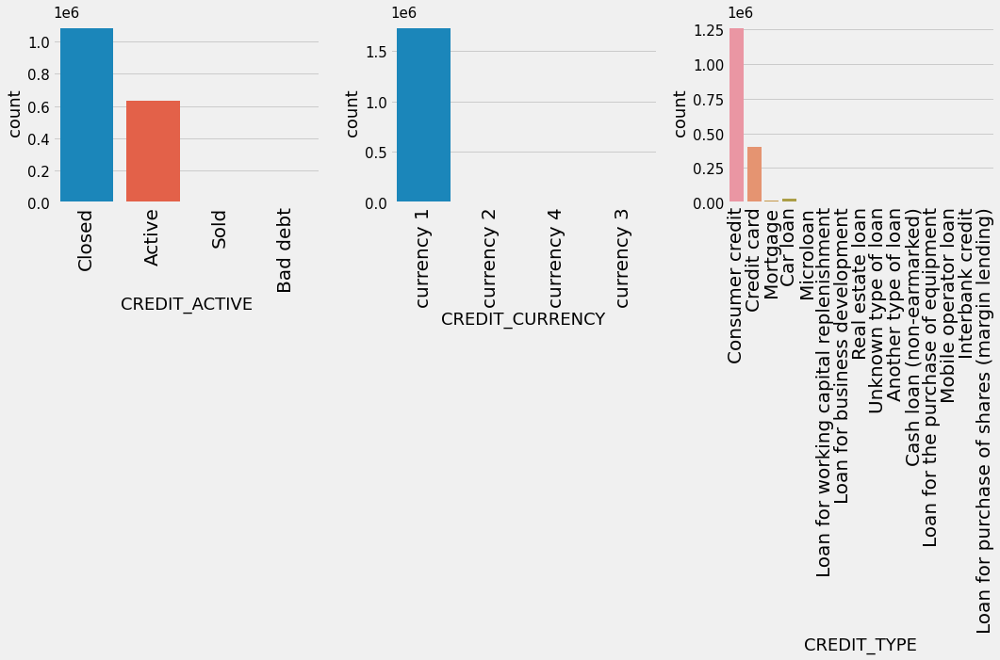

In [59]:
# Univariate Analysis

plt.figure(figsize=(15,10))
plotnum=1
for feature in cat_fe_bureau:
    if(plotnum<=len(cat_fe_bureau)): 
        ax=plt.subplot(1,3,plotnum) 
        sns.countplot(bureau[feature])
        plt.xticks(fontsize=20,rotation=90)
    plotnum+=1
plt.tight_layout() 

> - Most of the credits registered at the Credit Bureau are in the status Closed. On the second place are the Active credit.. Sold and Bad debt are just a few.
> - Credits are mostly in currency_1.
> - Majority of historical credits registered at the Credit Bureau are Consumer credit and Credit card. Smaller number of credits are Car loan, Mortgage and Microloan.


# 3.7 Skewness and Kurtosis

In [60]:
for feature in num_fe_bureau:
    print('{:15}'.format(feature), 
          'Skewness: {:05.2f}'.format(bureau[feature].skew()) , 
          '   ' ,
          'Kurtosis: {:06.2f}'.format(bureau[feature].kurt())  
         )

DAYS_CREDIT     Skewness: -0.58     Kurtosis: -00.74
CREDIT_DAY_OVERDUE Skewness: 55.93     Kurtosis: 3374.48
DAYS_CREDIT_ENDDATE Skewness: 05.13     Kurtosis: 028.18
DAYS_ENDDATE_FACT Skewness: -0.77     Kurtosis: 009.41
AMT_CREDIT_MAX_OVERDUE Skewness: 470.91     Kurtosis: 245696.92
CNT_CREDIT_PROLONG Skewness: 20.32     Kurtosis: 615.44
AMT_CREDIT_SUM  Skewness: 124.59     Kurtosis: 49315.97
AMT_CREDIT_SUM_DEBT Skewness: 36.41     Kurtosis: 5673.43
AMT_CREDIT_SUM_LIMIT Skewness: 18.03     Kurtosis: 796.10
AMT_CREDIT_SUM_OVERDUE Skewness: 403.24     Kurtosis: 211836.85
DAYS_CREDIT_UPDATE Skewness: -11.33     Kurtosis: 596.37
AMT_ANNUITY     Skewness: 212.54     Kurtosis: 58560.69


# 3.8 Outliers

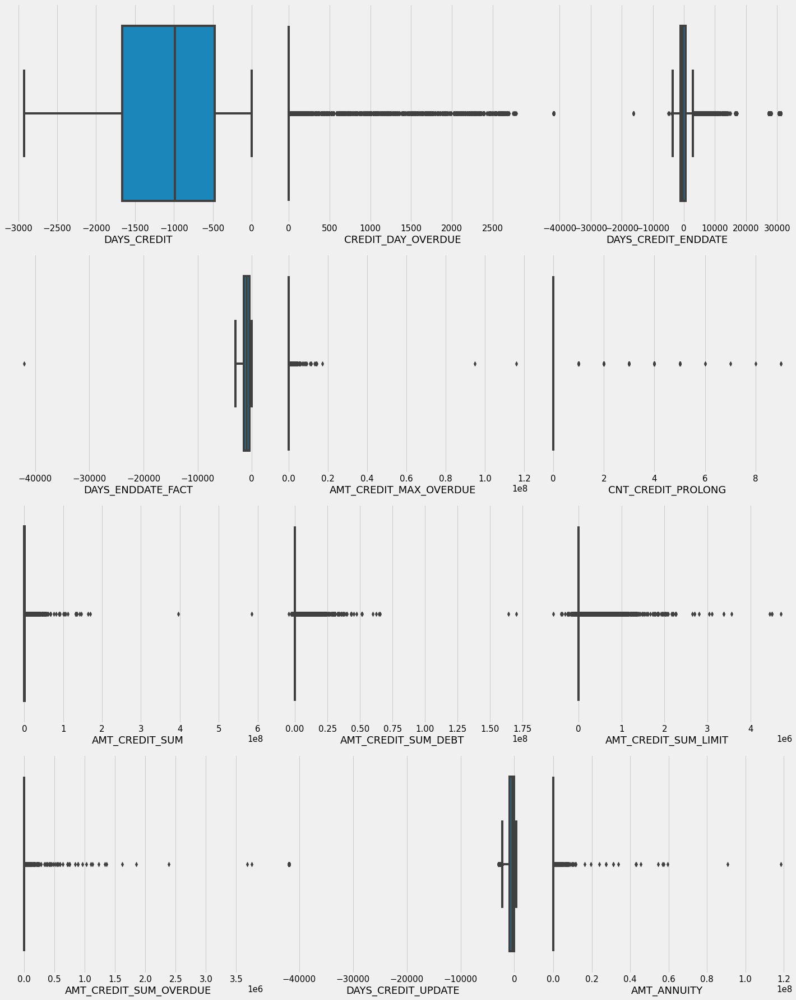

In [61]:
plt.figure(figsize=(20,25))
plotnum=1
for feature in num_fe_bureau:
           if(plotnum<=12):
                ax=plt.subplot(4,3,plotnum) 
                sns.boxplot(bureau[feature])
                plotnum+=1
plt.tight_layout() 

> There are outliers present. We will deal with them in the FE Section.

# 3.9 Heatmap

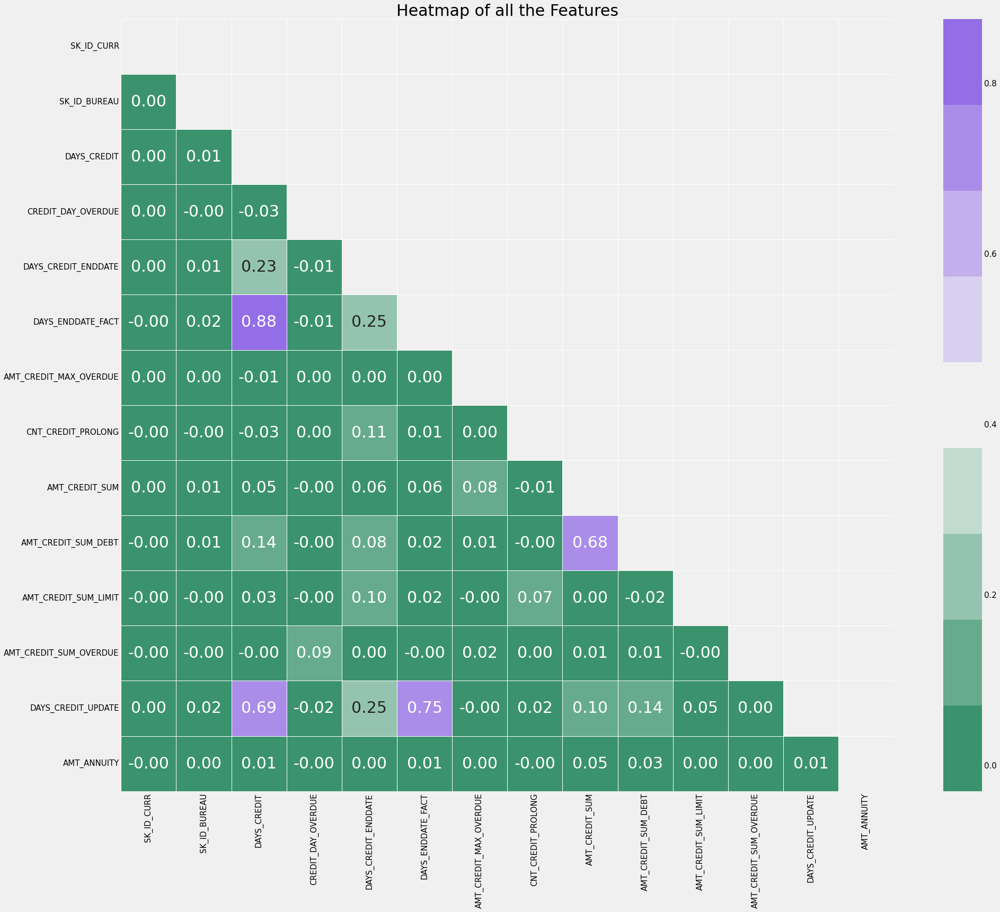

In [62]:
plt.subplots(figsize = (30,25))

mask = np.triu(np.ones_like(bureau.corr()))

sns.heatmap(bureau.corr(), 
            cmap=sns.diverging_palette(150, 275, s=80, l=55, n=9), 
            mask = mask, 
            annot=True, 
            square=True, linewidths=.5, fmt='.2f',annot_kws={'size': 30}
           );

plt.title("Heatmap of all the Features", fontsize = 30);

# 3.10 Multicollinearity

In [63]:
correlations=bureau.corr()
attrs = correlations.iloc[2:,2:]

threshold = 0.5
important_corrs = (attrs[abs(attrs) > threshold][attrs != 1.0]).unstack().dropna().to_dict()

unique_important_corrs=pd.DataFrame(important_corrs.items(),columns=['Attribute Pair', 'Correlation'])
multi_corr=unique_important_corrs.sort_values(by=['Correlation'],ascending = False,ignore_index= True)
multi_corr.iloc[::2]

,Attribute Pair,Correlation
0,"(DAYS_CREDIT, DAYS_ENDDATE_FACT)",0.875359
2,"(DAYS_ENDDATE_FACT, DAYS_CREDIT_UPDATE)",0.751294
4,"(DAYS_CREDIT, DAYS_CREDIT_UPDATE)",0.688771
6,"(AMT_CREDIT_SUM, AMT_CREDIT_SUM_DEBT)",0.683419


# 4. Bureau_balance Data

In [64]:
bureau_balance=pd.read_csv('bureau_balance.csv')
bureau_balance

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C
...,...,...,...
27299920,5041336,-47,X
27299921,5041336,-48,X
27299922,5041336,-49,X
27299923,5041336,-50,X


# 4.1 Basic Checks 

In [65]:
print('-'*100)
print('Shape of the DataFrame: ',bureau_balance.shape)
print('-'*100)
print('Info of the DataFrame: \n',bureau_balance.info())
print('-'*100)
print('Describe the DataFrame: \n',bureau_balance.describe())
print('-'*100)
print('Describe object types of the DataFrame: \n',bureau_balance.describe(include='O'))
print('-'*100)
print('Datatype of Each Column: \n',bureau_balance.dtypes)
print('-'*100)
print('Duplicated Values: ',bureau_balance.duplicated().sum())
print('-'*100)

----------------------------------------------------------------------------------------------------
Shape of the DataFrame:  (27299925, 3)
----------------------------------------------------------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27299925 entries, 0 to 27299924
Data columns (total 3 columns):
 #   Column          Dtype 
---  ------          ----- 
 0   SK_ID_BUREAU    int64 
 1   MONTHS_BALANCE  int64 
 2   STATUS          object
dtypes: int64(2), object(1)
memory usage: 624.8+ MB
Info of the DataFrame: 
 None
----------------------------------------------------------------------------------------------------
Describe the DataFrame: 
        SK_ID_BUREAU  MONTHS_BALANCE
count  2.729992e+07    2.729992e+07
mean   6.036297e+06   -3.074169e+01
std    4.923489e+05    2.386451e+01
min    5.001709e+06   -9.600000e+01
25%    5.730933e+06   -4.600000e+01
50%    6.070821e+06   -2.500000e+01
75%    6.431951e+06   -1.100000e+01
max    6

# 4.2 Missing Values

In [66]:
bureau_balance.isnull().sum().sum()

0

# 4.3 Numerical Features

In [67]:
num_fe_bureau_balance=[feature for feature in bureau_balance.columns if bureau_balance[feature].dtype!='O' and feature not in ['SK_ID_BUREAU']]
print('The no. of Numerical features in bureau_balance is : ',len(num_fe_bureau_balance))
print('The Numerical features in bureau_balance is : \n',num_fe_bureau_balance)

The no. of Numerical features in bureau_balance is :  1
The Numerical features in bureau_balance is : 
 ['MONTHS_BALANCE']


# 4.4 Discrete Features

<AxesSubplot:xlabel='MONTHS_BALANCE', ylabel='Density'>

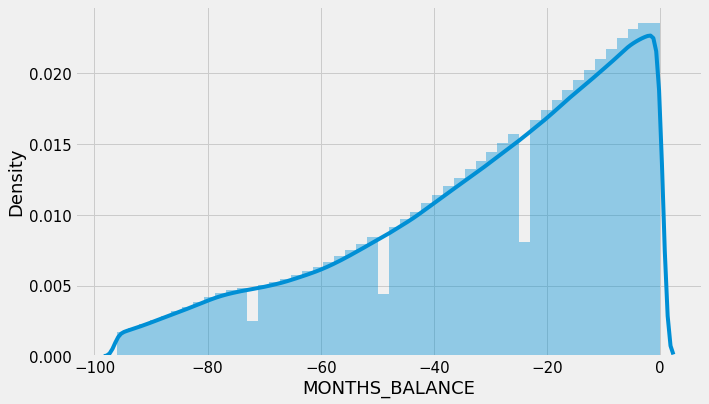

In [68]:
sns.distplot(bureau_balance.MONTHS_BALANCE)

> Most of them have the freshest balance updated at the time of application

# 4.5 Categorical Features

In [69]:
cat_fe_bureau_balance=[feature for feature in bureau_balance.columns if bureau_balance[feature].dtype=='O']
print('The no. of Categorical features in bureau_balance is : ',len(cat_fe_bureau_balance))
print('The Categorical features in bureau_balance is : \n',cat_fe_bureau_balance)

The no. of Categorical features in bureau_balance is :  1
The Categorical features in bureau_balance is : 
 ['STATUS']


## Number of Unique categories in each feature

In [70]:
for feature in cat_fe_bureau_balance:
    print('The no. of unique categories in {} feature of bureau_balance is : {}'.format(feature,bureau_balance[feature].nunique()))

The no. of unique categories in STATUS feature of bureau_balance is : 8


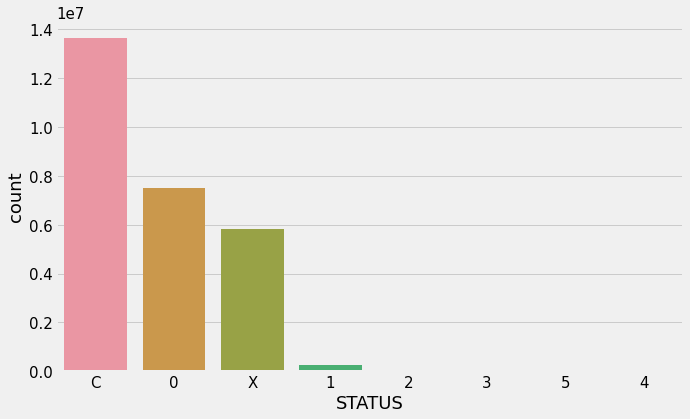

In [71]:
# Univariate Analysis

for feature in cat_fe_bureau_balance: 
        sns.countplot(bureau_balance[feature])

> Most are able to close the credit bureau loan for a particular month

# 4.6 Skewness and Kurtosis

In [72]:
for feature in num_fe_bureau_balance:
    print('{:15}'.format(feature), 
          'Skewness: {:05.2f}'.format(bureau_balance[feature].skew()) , 
          '   ' ,
          'Kurtosis: {:06.2f}'.format(bureau_balance[feature].kurt())  
         )

MONTHS_BALANCE  Skewness: -0.76     Kurtosis: -00.32


# 4.7 Outliers

<AxesSubplot:xlabel='MONTHS_BALANCE'>

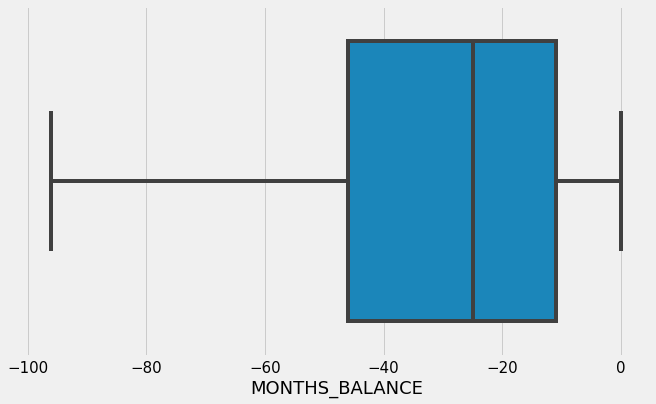

In [73]:
sns.boxplot(bureau_balance.MONTHS_BALANCE)

# 5. Credit_card_balance Data

In [74]:
credit_card_balance=pd.read_csv('credit_card_balance.csv')
credit_card_balance

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,1800.00,1800.000,0.000,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,2250.00,2250.000,60175.080,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,2250.00,2250.000,26926.425,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,11925.00,11925.000,224949.285,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,27000.00,27000.000,443044.395,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3840307,1036507,328243,-9,0.000,45000,NaN,0.0,NaN,NaN,0.000,NaN,0.000,0.000,0.000,0.000,NaN,0,NaN,NaN,0.0,Active,0,0
3840308,1714892,347207,-9,0.000,45000,0.0,0.0,0.0,0.0,0.000,1879.11,0.000,0.000,0.000,0.000,0.0,0,0.0,0.0,23.0,Active,0,0
3840309,1302323,215757,-9,275784.975,585000,270000.0,270000.0,0.0,0.0,2250.000,375750.00,356994.675,269356.140,273093.975,273093.975,2.0,2,0.0,0.0,18.0,Active,0,0
3840310,1624872,430337,-10,0.000,450000,NaN,0.0,NaN,NaN,0.000,NaN,0.000,0.000,0.000,0.000,NaN,0,NaN,NaN,0.0,Active,0,0


# 5.1 Basic Checks 

In [75]:
print('-'*100)
print('Shape of the DataFrame: ',credit_card_balance.shape)
print('-'*100)
print('Info of the DataFrame: \n',credit_card_balance.info())
print('-'*100)
print('Describe the DataFrame: \n',credit_card_balance.describe())
print('-'*100)
print('Describe object types of the DataFrame: \n',credit_card_balance.describe(include='O'))
print('-'*100)
print('Datatype of Each Column: \n',credit_card_balance.dtypes)
print('-'*100)
print('Duplicated Values: ',credit_card_balance.duplicated().sum())
print('-'*100)

----------------------------------------------------------------------------------------------------
Shape of the DataFrame:  (3840312, 23)
----------------------------------------------------------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3840312 entries, 0 to 3840311
Data columns (total 23 columns):
 #   Column                      Dtype  
---  ------                      -----  
 0   SK_ID_PREV                  int64  
 1   SK_ID_CURR                  int64  
 2   MONTHS_BALANCE              int64  
 3   AMT_BALANCE                 float64
 4   AMT_CREDIT_LIMIT_ACTUAL     int64  
 5   AMT_DRAWINGS_ATM_CURRENT    float64
 6   AMT_DRAWINGS_CURRENT        float64
 7   AMT_DRAWINGS_OTHER_CURRENT  float64
 8   AMT_DRAWINGS_POS_CURRENT    float64
 9   AMT_INST_MIN_REGULARITY     float64
 10  AMT_PAYMENT_CURRENT         float64
 11  AMT_PAYMENT_TOTAL_CURRENT   float64
 12  AMT_RECEIVABLE_PRINCIPAL    float64
 13  AMT_RECIVABLE             

# 5.2 Missing Values

Your selected dataframe has 23 columns.
There are 9 columns that have missing values.


,Total,Percent
AMT_PAYMENT_CURRENT,767988,19.998063
AMT_DRAWINGS_ATM_CURRENT,749816,19.524872
CNT_DRAWINGS_POS_CURRENT,749816,19.524872
AMT_DRAWINGS_OTHER_CURRENT,749816,19.524872
AMT_DRAWINGS_POS_CURRENT,749816,19.524872
CNT_DRAWINGS_OTHER_CURRENT,749816,19.524872
CNT_DRAWINGS_ATM_CURRENT,749816,19.524872
CNT_INSTALMENT_MATURE_CUM,305236,7.948208
AMT_INST_MIN_REGULARITY,305236,7.948208


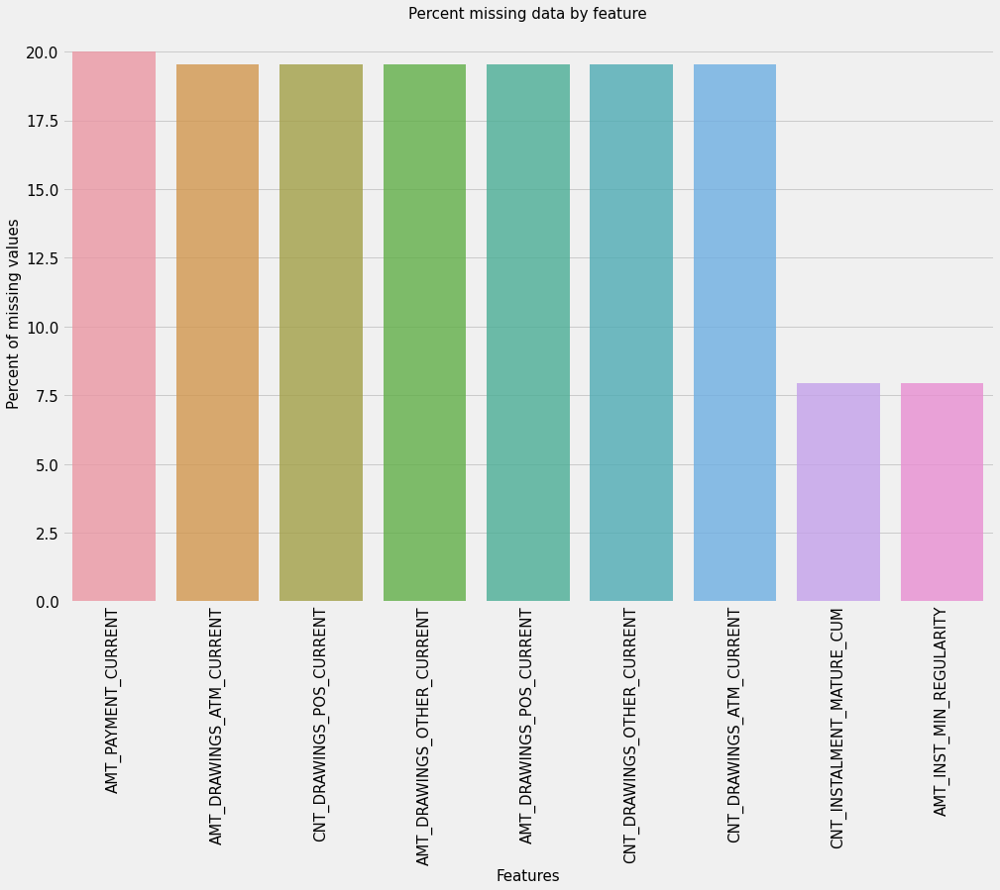

In [76]:
missing_data_credit_card_balance = missingdata(credit_card_balance)
missing_data_credit_card_balance

> There are lot of missing values. We will have to impute them with something meaningful.

# 5.3 Numerical Features

In [77]:
num_fe_credit_card_balance=[feature for feature in credit_card_balance.columns if credit_card_balance[feature].dtype!='O' and feature not in ['SK_ID_PREV','SK_ID_CURR']]
print('The no. of Numerical features in credit_card_balance is : ',len(num_fe_credit_card_balance))
print('The Numerical features in credit_card_balance is : \n',num_fe_credit_card_balance)

The no. of Numerical features in credit_card_balance is :  20
The Numerical features in credit_card_balance is : 
 ['MONTHS_BALANCE', 'AMT_BALANCE', 'AMT_CREDIT_LIMIT_ACTUAL', 'AMT_DRAWINGS_ATM_CURRENT', 'AMT_DRAWINGS_CURRENT', 'AMT_DRAWINGS_OTHER_CURRENT', 'AMT_DRAWINGS_POS_CURRENT', 'AMT_INST_MIN_REGULARITY', 'AMT_PAYMENT_CURRENT', 'AMT_PAYMENT_TOTAL_CURRENT', 'AMT_RECEIVABLE_PRINCIPAL', 'AMT_RECIVABLE', 'AMT_TOTAL_RECEIVABLE', 'CNT_DRAWINGS_ATM_CURRENT', 'CNT_DRAWINGS_CURRENT', 'CNT_DRAWINGS_OTHER_CURRENT', 'CNT_DRAWINGS_POS_CURRENT', 'CNT_INSTALMENT_MATURE_CUM', 'SK_DPD', 'SK_DPD_DEF']


# 5.4 Discrete Features

In [78]:
dis_fe_credit_card_balance=[feature for feature in num_fe_credit_card_balance if (credit_card_balance[feature].dtype=='int8' or credit_card_balance[feature].dtype=='int16' or credit_card_balance[feature].dtype=='int64')]
dis_fe_credit_card_balance.remove('AMT_CREDIT_LIMIT_ACTUAL')
dis_fe_credit_card_balance.append('CNT_DRAWINGS_ATM_CURRENT')
dis_fe_credit_card_balance.append('CNT_DRAWINGS_OTHER_CURRENT')
dis_fe_credit_card_balance.append('CNT_DRAWINGS_POS_CURRENT')
dis_fe_credit_card_balance.append('CNT_INSTALMENT_MATURE_CUM')
dis_fe_credit_card_balance

['MONTHS_BALANCE',
 'CNT_DRAWINGS_CURRENT',
 'SK_DPD',
 'SK_DPD_DEF',
 'CNT_DRAWINGS_ATM_CURRENT',
 'CNT_DRAWINGS_OTHER_CURRENT',
 'CNT_DRAWINGS_POS_CURRENT',
 'CNT_INSTALMENT_MATURE_CUM']

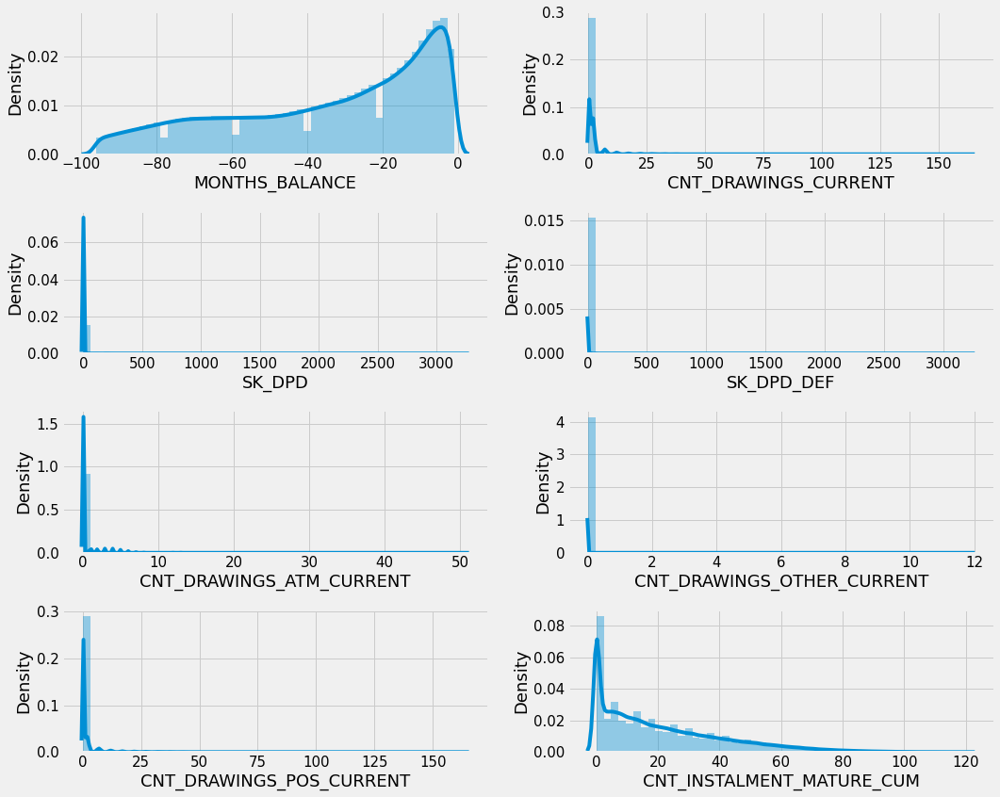

In [79]:
# Univariate Analysis :

plt.figure(figsize=(15,12))
plotnum=1
for feature in dis_fe_credit_card_balance:
    if(plotnum<=8):
        ax=plt.subplot(4,2,plotnum) 
        sns.distplot(credit_card_balance[feature])
    plotnum+=1
plt.tight_layout()  

> - There are only 1 or 2 Drawings from ATM for goods during this month on the previous credit.
> - The number of paid installments gradually decreases.

# 5.5 Continuous Features

In [80]:
conti_fe_credit_card_balance=[feature for feature in num_fe_credit_card_balance if feature not in dis_fe_credit_card_balance]
conti_fe_credit_card_balance

['AMT_BALANCE',
 'AMT_CREDIT_LIMIT_ACTUAL',
 'AMT_DRAWINGS_ATM_CURRENT',
 'AMT_DRAWINGS_CURRENT',
 'AMT_DRAWINGS_OTHER_CURRENT',
 'AMT_DRAWINGS_POS_CURRENT',
 'AMT_INST_MIN_REGULARITY',
 'AMT_PAYMENT_CURRENT',
 'AMT_PAYMENT_TOTAL_CURRENT',
 'AMT_RECEIVABLE_PRINCIPAL',
 'AMT_RECIVABLE',
 'AMT_TOTAL_RECEIVABLE']

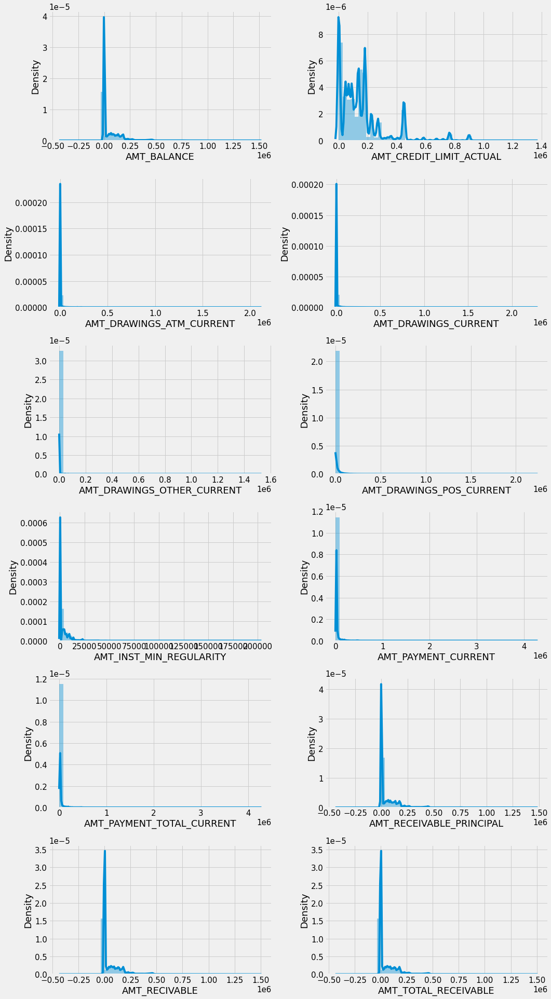

In [81]:
# Univariate Analysis :

plt.figure(figsize=(15,27))
plotnum=1
for feature in conti_fe_credit_card_balance:
    if(plotnum<=12):
        ax=plt.subplot(6,2,plotnum) 
        sns.distplot(credit_card_balance[feature])
    plotnum+=1
plt.tight_layout()  

> - Credit card limit was mostly close to 20,000 with few expectionns
> - There were not much amount drawn during the month.
> - Total amount recievable on the previous credit was also close to 20,000.

# 5.6 Categorical Features

In [82]:
cat_fe_credit_card_balance=[feature for feature in credit_card_balance.columns if credit_card_balance[feature].dtype=='O']
print('The no. of Categorical features in credit_card_balance is : ',len(cat_fe_credit_card_balance))
print('The Categorical features in credit_card_balance is : \n',cat_fe_credit_card_balance)

The no. of Categorical features in credit_card_balance is :  1
The Categorical features in credit_card_balance is : 
 ['NAME_CONTRACT_STATUS']


## Number of Unique categories in each feature

In [83]:
for feature in cat_fe_credit_card_balance:
    print('The no. of unique categories in {} feature of credit_card_balance is : {}'.format(feature,credit_card_balance[feature].nunique()))

The no. of unique categories in NAME_CONTRACT_STATUS feature of credit_card_balance is : 7


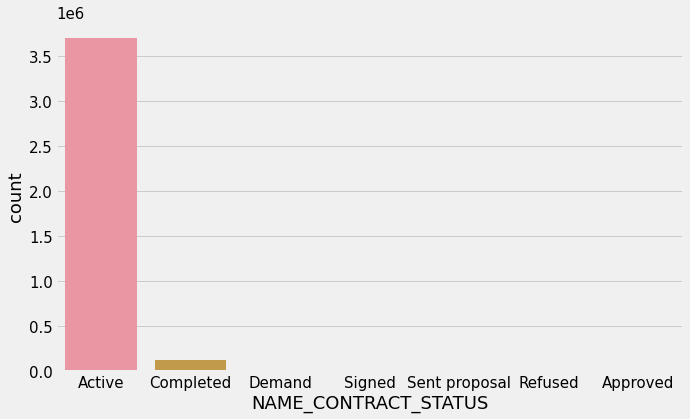

In [84]:
# Univariate Analysis

for feature in cat_fe_credit_card_balance: 
        sns.countplot(credit_card_balance[feature])

> Most of them has active contract status on their previous credit.

# 5.7 Skewness and Kurtosis

In [85]:
for feature in num_fe_credit_card_balance:
    print('{:15}'.format(feature), 
          'Skewness: {:05.2f}'.format(credit_card_balance[feature].skew()) , 
          '   ' ,
          'Kurtosis: {:06.2f}'.format(credit_card_balance[feature].kurt())  
         )

MONTHS_BALANCE  Skewness: -0.60     Kurtosis: -00.86
AMT_BALANCE     Skewness: 02.92     Kurtosis: 011.78
AMT_CREDIT_LIMIT_ACTUAL Skewness: 02.06     Kurtosis: 005.18
AMT_DRAWINGS_ATM_CURRENT Skewness: 09.66     Kurtosis: 164.93
AMT_DRAWINGS_CURRENT Skewness: 10.07     Kurtosis: 184.27
AMT_DRAWINGS_OTHER_CURRENT Skewness: 50.57     Kurtosis: 3628.01
AMT_DRAWINGS_POS_CURRENT Skewness: 19.42     Kurtosis: 713.99
AMT_INST_MIN_REGULARITY Skewness: 02.49     Kurtosis: 010.18
AMT_PAYMENT_CURRENT Skewness: 12.99     Kurtosis: 315.76
AMT_PAYMENT_TOTAL_CURRENT Skewness: 14.48     Kurtosis: 393.26
AMT_RECEIVABLE_PRINCIPAL Skewness: 02.94     Kurtosis: 011.96
AMT_RECIVABLE   Skewness: 02.91     Kurtosis: 011.72
AMT_TOTAL_RECEIVABLE Skewness: 02.91     Kurtosis: 011.72
CNT_DRAWINGS_ATM_CURRENT Skewness: 06.91     Kurtosis: 081.55
CNT_DRAWINGS_CURRENT Skewness: 10.64     Kurtosis: 177.93
CNT_DRAWINGS_OTHER_CURRENT Skewness: 26.32     Kurtosis: 1253.26
CNT_DRAWINGS_POS_CURRENT Skewness: 11.35     Ku

# 5.8 Outliers

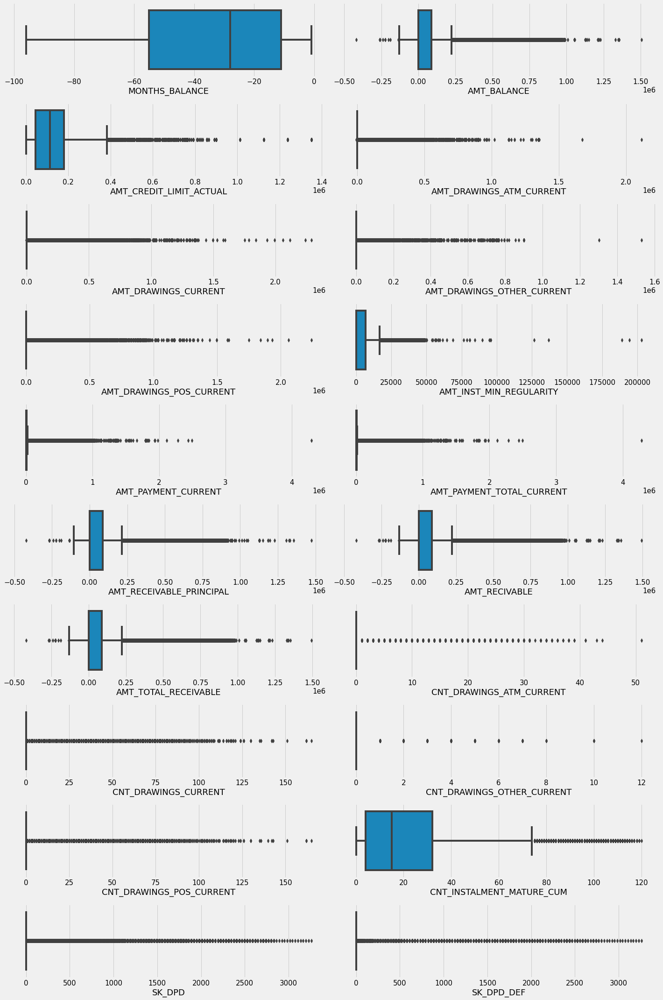

In [86]:
plt.figure(figsize=(20,30))
plotnum=1
for feature in num_fe_credit_card_balance:
        if(plotnum<=20):
                ax=plt.subplot(10,2,plotnum) 
                sns.boxplot(credit_card_balance[feature])
        plotnum+=1
plt.tight_layout() 

> There are outliers present. We will deal with them in the FE Section.

# 5.9 Heatmap

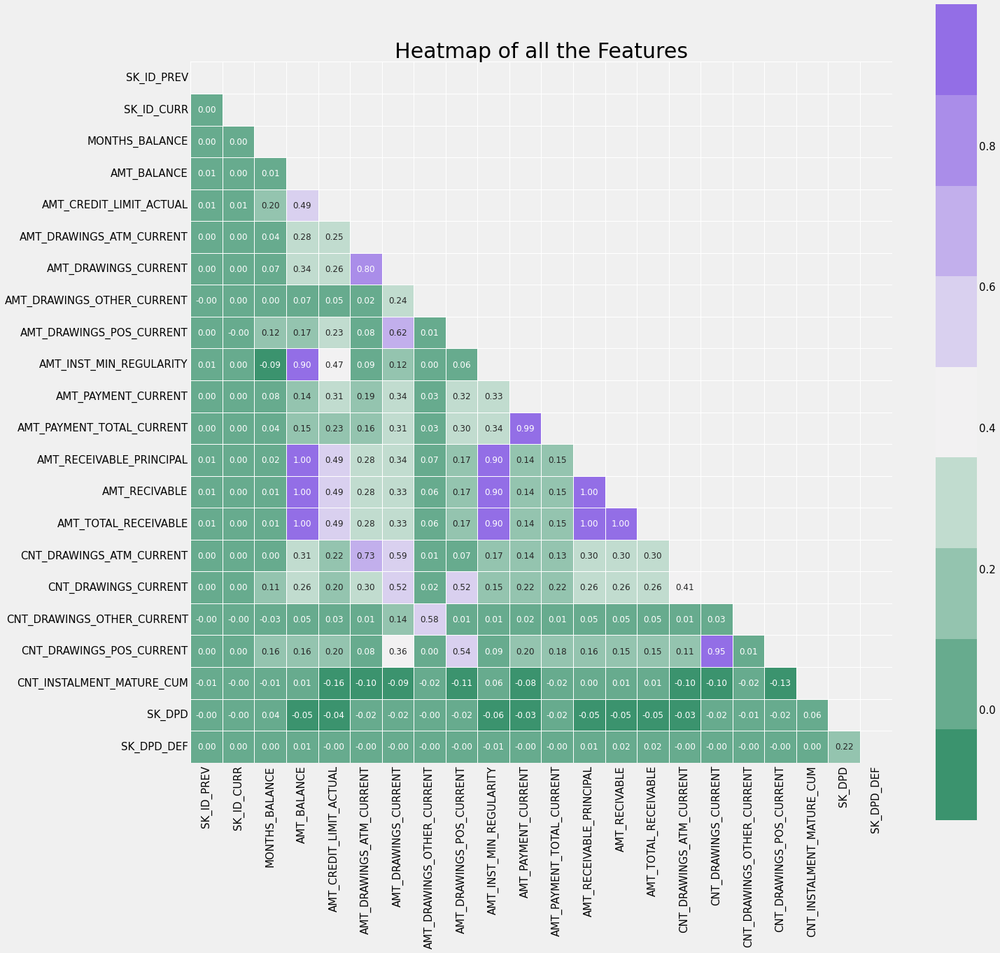

In [87]:
plt.subplots(figsize = (20,20))

mask = np.triu(np.ones_like(credit_card_balance.corr()))

sns.heatmap(credit_card_balance.corr(), 
            cmap=sns.diverging_palette(150, 275, s=80, l=55, n=9), 
            mask = mask, 
            annot=True, 
            square=True, linewidths=.5, fmt='.2f',annot_kws={'size': 12}
           );

plt.title("Heatmap of all the Features", fontsize = 30);

# 5.10 Multicollinearity

In [88]:
correlations=credit_card_balance.corr()
attrs = correlations.iloc[2:,2:] 

threshold = 0.5
important_corrs = (attrs[abs(attrs) > threshold][attrs != 1.0]).unstack().dropna().to_dict()

unique_important_corrs=pd.DataFrame(important_corrs.items(),columns=['Attribute Pair', 'Correlation'])
multi_corr=unique_important_corrs.sort_values(by=['Correlation'],ascending = False,ignore_index= True)
multi_corr.iloc[::2]

,Attribute Pair,Correlation
0,"(AMT_TOTAL_RECEIVABLE, AMT_RECIVABLE)",0.999995
2,"(AMT_BALANCE, AMT_RECIVABLE)",0.999917
4,"(AMT_BALANCE, AMT_TOTAL_RECEIVABLE)",0.999897
6,"(AMT_RECIVABLE, AMT_RECEIVABLE_PRINCIPAL)",0.999727
8,"(AMT_RECEIVABLE_PRINCIPAL, AMT_BALANCE)",0.999720
10,"(AMT_TOTAL_RECEIVABLE, AMT_RECEIVABLE_PRINCIPAL)",0.999702
12,"(AMT_PAYMENT_CURRENT, AMT_PAYMENT_TOTAL_CURRENT)",0.994764
14,"(CNT_DRAWINGS_CURRENT, CNT_DRAWINGS_POS_CURRENT)",0.950546
16,"(AMT_INST_MIN_REGULARITY, AMT_RECIVABLE)",0.897617
18,"(AMT_TOTAL_RECEIVABLE, AMT_INST_MIN_REGULARITY)",0.897587


# 6. Installments_payments Data

In [89]:
installments_payments=pd.read_csv('installments_payments.csv')
installments_payments

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585
...,...,...,...,...,...,...,...,...
13605396,2186857,428057,0.0,66,-1624.0,NaN,67.500,NaN
13605397,1310347,414406,0.0,47,-1539.0,NaN,67.500,NaN
13605398,1308766,402199,0.0,43,-7.0,NaN,43737.435,NaN
13605399,1062206,409297,0.0,43,-1986.0,NaN,67.500,NaN


# 6.1 Basic Checks 

In [90]:
print('-'*100)
print('Shape of the DataFrame: ',installments_payments.shape)
print('-'*100)
print('Info of the DataFrame: \n',installments_payments.info())
print('-'*100)
print('Describe the DataFrame: \n',installments_payments.describe())
print('-'*100)
print('Datatype of Each Column: \n',installments_payments.dtypes)
print('-'*100)
print('Duplicated Values: ',installments_payments.duplicated().sum())
print('-'*100)

----------------------------------------------------------------------------------------------------
Shape of the DataFrame:  (13605401, 8)
----------------------------------------------------------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13605401 entries, 0 to 13605400
Data columns (total 8 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_PREV              int64  
 1   SK_ID_CURR              int64  
 2   NUM_INSTALMENT_VERSION  float64
 3   NUM_INSTALMENT_NUMBER   int64  
 4   DAYS_INSTALMENT         float64
 5   DAYS_ENTRY_PAYMENT      float64
 6   AMT_INSTALMENT          float64
 7   AMT_PAYMENT             float64
dtypes: float64(5), int64(3)
memory usage: 830.4 MB
Info of the DataFrame: 
 None
----------------------------------------------------------------------------------------------------
Describe the DataFrame: 
          SK_ID_PREV    SK_ID_CURR  NUM_INSTALMENT_VERSION  \
count

# 6.2 Missing Values

Your selected dataframe has 8 columns.
There are 2 columns that have missing values.


,Total,Percent
DAYS_ENTRY_PAYMENT,2905,0.021352
AMT_PAYMENT,2905,0.021352


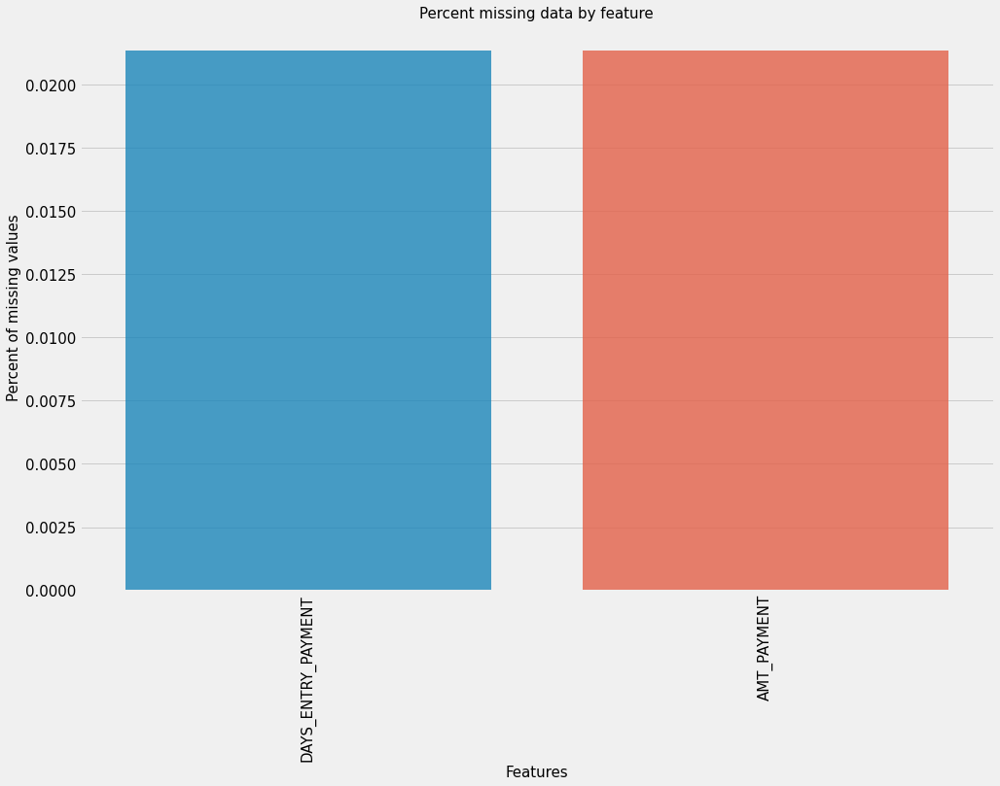

In [91]:
missing_data_installments_payments = missingdata(installments_payments)
missing_data_installments_payments

> There are lot of missing values. We will have to impute them with something meaningful.

# 6.3 Numerical Features

In [92]:
num_fe_installments_payments=[feature for feature in installments_payments.columns if installments_payments[feature].dtype!='O' and feature not in ['SK_ID_PREV','SK_ID_CURR']]
print('The no. of Numerical features in installments_payments is : ',len(num_fe_installments_payments))
print('The Numerical features in installments_payments is : \n',num_fe_installments_payments)

The no. of Numerical features in installments_payments is :  6
The Numerical features in installments_payments is : 
 ['NUM_INSTALMENT_VERSION', 'NUM_INSTALMENT_NUMBER', 'DAYS_INSTALMENT', 'DAYS_ENTRY_PAYMENT', 'AMT_INSTALMENT', 'AMT_PAYMENT']


# 6.4 Discrete Features

In [93]:
dis_fe_installments_payments=['NUM_INSTALMENT_VERSION', 'NUM_INSTALMENT_NUMBER', 'DAYS_INSTALMENT', 'DAYS_ENTRY_PAYMENT']

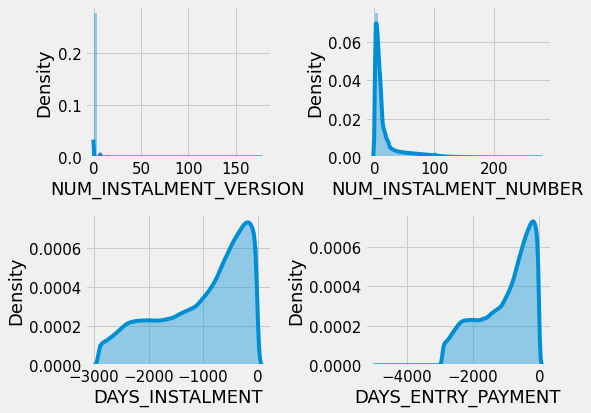

In [94]:
# Univariate Analysis :

plt.figure(figsize=(8,6))#,facecolor='white')
plotnum=1
for feature in dis_fe_installments_payments:
    if(plotnum<=4):
        ax=plt.subplot(2,2,plotnum) 
        sns.distplot(installments_payments[feature])
    plotnum+=1
plt.tight_layout()  

> The installments of the previous credit were mostly paid 500 days prior to the alients application date.

# 6.5 Continuous Features

In [95]:
conti_fe_installments_payments=[feature for feature in num_fe_installments_payments if feature not in dis_fe_installments_payments]
conti_fe_installments_payments

['AMT_INSTALMENT', 'AMT_PAYMENT']

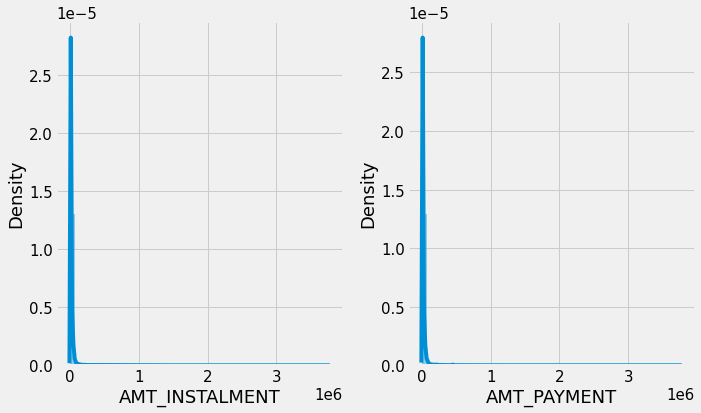

In [96]:
# Univariate Analysis :

plt.figure(figsize=(10,6))
plotnum=1
for feature in conti_fe_installments_payments:
    if(plotnum<=2):
        ax=plt.subplot(1,2,plotnum) 
        sns.distplot(installments_payments[feature])
    plotnum+=1
plt.tight_layout()  

> Prescribed Installation amount was around 20,000 and most of them paid close to the amount.

# 6.6 Categorical Features

In [97]:
cat_fe_installments_payments=[feature for feature in installments_payments.columns if installments_payments[feature].dtype=='O']
print('The no. of Categorical features in installments_payments is : ',len(cat_fe_installments_payments))
print('The Categorical features in installments_payments is : \n',cat_fe_installments_payments)

The no. of Categorical features in installments_payments is :  0
The Categorical features in installments_payments is : 
 []


# 6.7 Skewness and Kurtosis

In [98]:
for feature in num_fe_installments_payments:
    print('{:15}'.format(feature), 
          'Skewness: {:05.2f}'.format(installments_payments[feature].skew()) , 
          '   ' ,
          'Kurtosis: {:06.2f}'.format(installments_payments[feature].kurt())  
         )

NUM_INSTALMENT_VERSION Skewness: 09.59     Kurtosis: 259.61
NUM_INSTALMENT_NUMBER Skewness: 02.50     Kurtosis: 006.71
DAYS_INSTALMENT Skewness: -0.63     Kurtosis: -00.80
DAYS_ENTRY_PAYMENT Skewness: -0.63     Kurtosis: -00.80
AMT_INSTALMENT  Skewness: 16.24     Kurtosis: 388.84
AMT_PAYMENT     Skewness: 14.95     Kurtosis: 324.60


# 6.8 Outliers

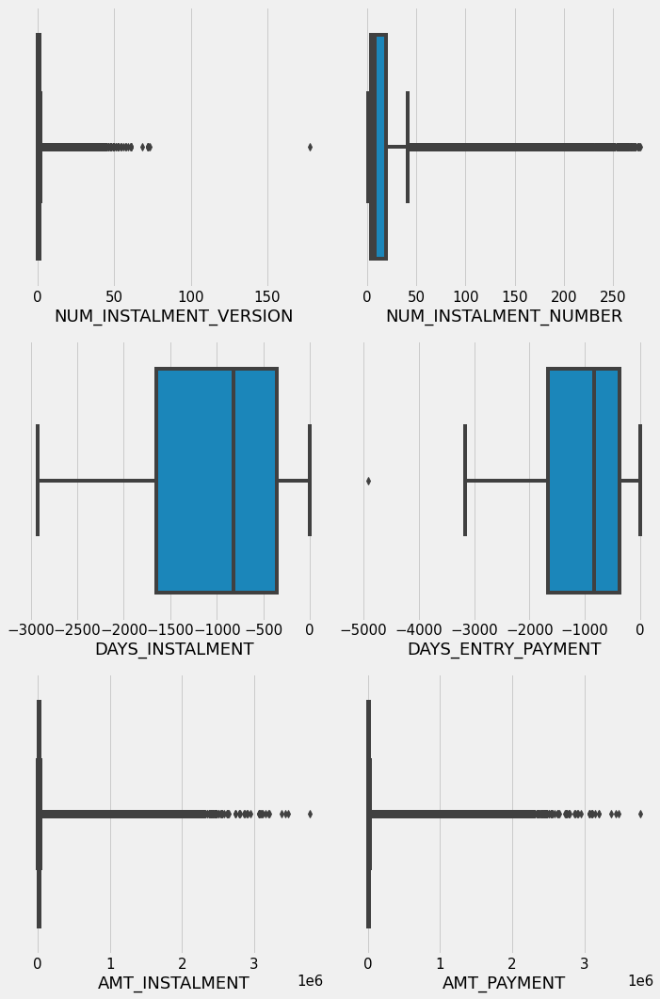

In [99]:
plt.figure(figsize=(10,15))
plotnum=1
for feature in num_fe_installments_payments:
        if(plotnum<=6):
                ax=plt.subplot(3,2,plotnum) 
                sns.boxplot(installments_payments[feature])
        plotnum+=1
plt.tight_layout() 

> There are outliers present. We will deal with them in the FE Section.

# 6.9 Heatmap

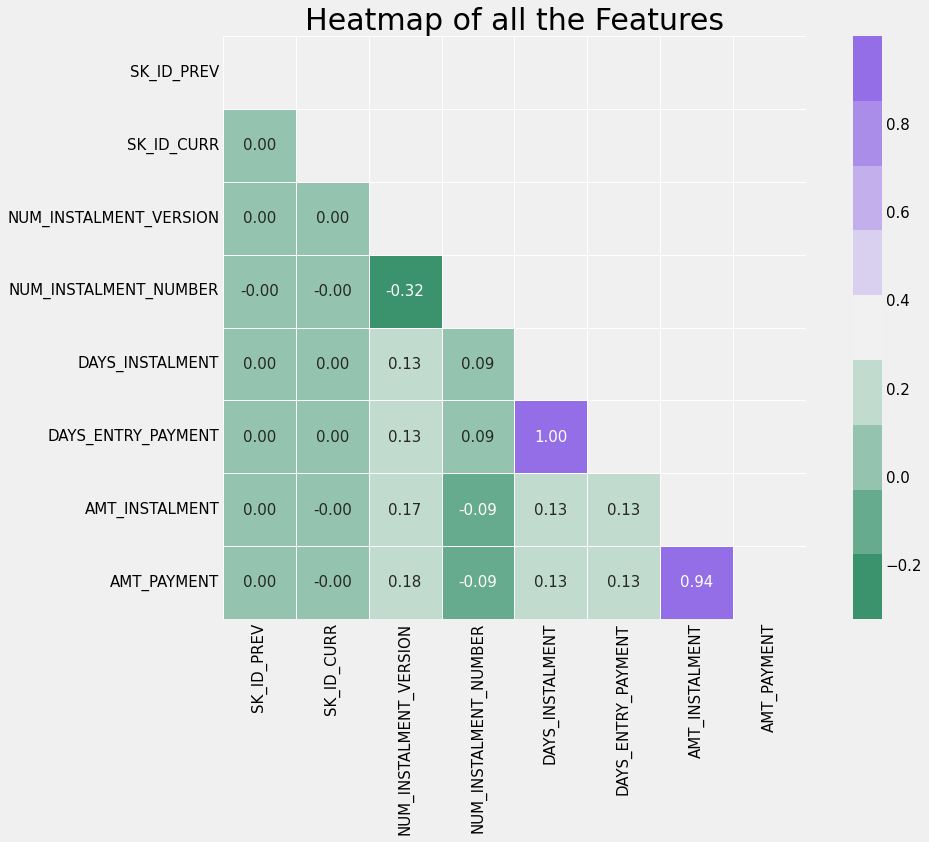

In [100]:
plt.subplots(figsize = (15,10))

mask = np.triu(np.ones_like(installments_payments.corr()))

sns.heatmap(installments_payments.corr(), 
            cmap=sns.diverging_palette(150, 275, s=80, l=55, n=9), 
            mask = mask, 
            annot=True, 
            square=True, linewidths=.5, fmt='.2f',annot_kws={'size': 15}
           );

plt.title("Heatmap of all the Features", fontsize = 30);

# 6.10 Multicollinearity

In [101]:
correlations=installments_payments.corr()
attrs = correlations.iloc[2:,2:] 

threshold = 0.5
important_corrs = (attrs[abs(attrs) > threshold][attrs != 1.0]).unstack().dropna().to_dict()

unique_important_corrs=pd.DataFrame(important_corrs.items(),columns=['Attribute Pair', 'Correlation'])
multi_corr=unique_important_corrs.sort_values(by=['Correlation'],ascending = False,ignore_index= True)
multi_corr.iloc[::2]

,Attribute Pair,Correlation
0,"(DAYS_INSTALMENT, DAYS_ENTRY_PAYMENT)",0.999491
2,"(AMT_INSTALMENT, AMT_PAYMENT)",0.937191


# 7. Pos_cash_balance Data

In [102]:
pos_cash_balance=pd.read_csv('pos_cash_balance.csv')
pos_cash_balance

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0
...,...,...,...,...,...,...,...,...
10001353,2448283,226558,-20,6.0,0.0,Active,843,0
10001354,1717234,141565,-19,12.0,0.0,Active,602,0
10001355,1283126,315695,-21,10.0,0.0,Active,609,0
10001356,1082516,450255,-22,12.0,0.0,Active,614,0


# 7.1 Basic Checks

In [103]:
print('-'*100)
print('Shape of the DataFrame: ',pos_cash_balance.shape)
print('-'*100)
print('Info of the DataFrame: \n',pos_cash_balance.info())
print('-'*100)
print('Describe the DataFrame: \n',pos_cash_balance.describe())
print('-'*100)
print('Describe object types of the DataFrame: \n',pos_cash_balance.describe(include='O'))
print('-'*100)
print('Datatype of Each Column: \n',pos_cash_balance.dtypes)
print('-'*100)
print('Duplicated Values: ',pos_cash_balance.duplicated().sum())
print('-'*100)

----------------------------------------------------------------------------------------------------
Shape of the DataFrame:  (10001358, 8)
----------------------------------------------------------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10001358 entries, 0 to 10001357
Data columns (total 8 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   SK_ID_PREV             int64  
 1   SK_ID_CURR             int64  
 2   MONTHS_BALANCE         int64  
 3   CNT_INSTALMENT         float64
 4   CNT_INSTALMENT_FUTURE  float64
 5   NAME_CONTRACT_STATUS   object 
 6   SK_DPD                 int64  
 7   SK_DPD_DEF             int64  
dtypes: float64(2), int64(5), object(1)
memory usage: 610.4+ MB
Info of the DataFrame: 
 None
----------------------------------------------------------------------------------------------------
Describe the DataFrame: 
          SK_ID_PREV    SK_ID_CURR  MONTHS_BALANCE  CNT_INSTALMEN

# 7.2 Missing Values

Your selected dataframe has 8 columns.
There are 2 columns that have missing values.


,Total,Percent
CNT_INSTALMENT_FUTURE,26087,0.260835
CNT_INSTALMENT,26071,0.260675


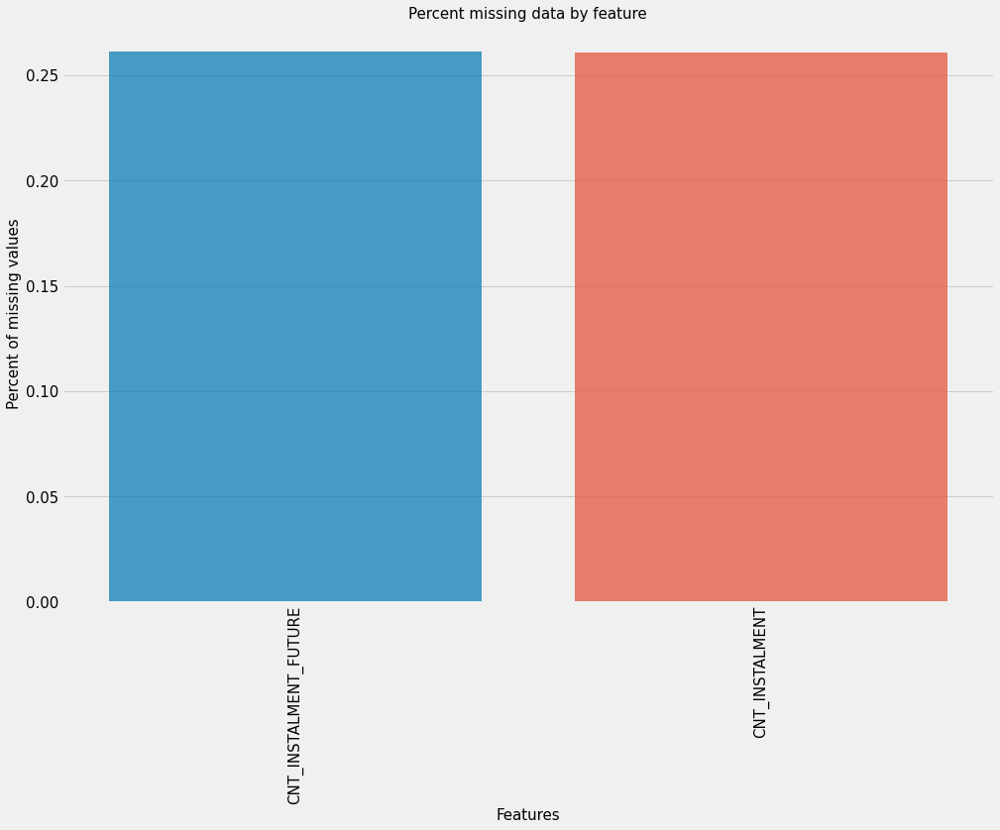

In [104]:
missing_data_pos_cash_balance= missingdata(pos_cash_balance)
missing_data_pos_cash_balance

> There are lot of missing values. We will have to impute them with something meaningful.

# 7.3 Numerical Features

In [105]:
num_fe_pos_cash_balance=[feature for feature in pos_cash_balance.columns if pos_cash_balance[feature].dtype!='O' and feature not in ['SK_ID_PREV','SK_ID_CURR']]
print('The no. of Numerical features in pos_cash_balance is : ',len(num_fe_pos_cash_balance))
print('The Numerical features in pos_cash_balance is : \n',num_fe_pos_cash_balance)

The no. of Numerical features in pos_cash_balance is :  5
The Numerical features in pos_cash_balance is : 
 ['MONTHS_BALANCE', 'CNT_INSTALMENT', 'CNT_INSTALMENT_FUTURE', 'SK_DPD', 'SK_DPD_DEF']


# 7.4 Discrete Features

In [106]:
dis_fe_pos_cash_balance=num_fe_pos_cash_balance.copy()
dis_fe_pos_cash_balance

['MONTHS_BALANCE',
 'CNT_INSTALMENT',
 'CNT_INSTALMENT_FUTURE',
 'SK_DPD',
 'SK_DPD_DEF']

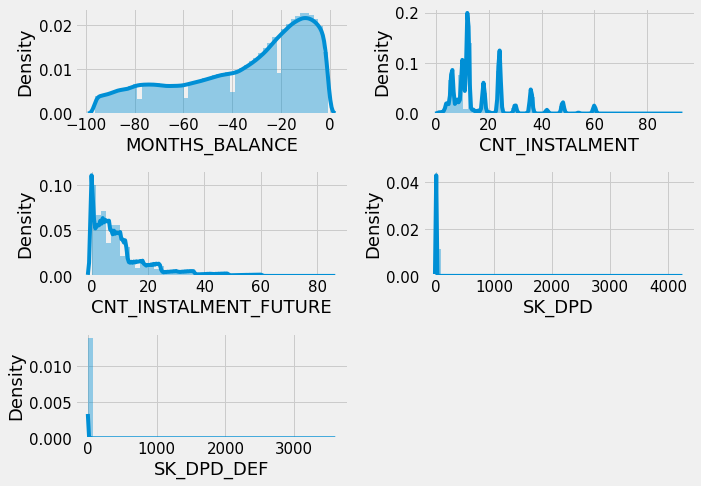

In [107]:
# Univariate Analysis :

plt.figure(figsize=(10,7))
plotnum=1
for feature in dis_fe_pos_cash_balance:
    if(plotnum<=5):
        ax=plt.subplot(3,2,plotnum) 
        sns.distplot(pos_cash_balance[feature])
    plotnum+=1
plt.tight_layout()

> - Month of balance relative to application date is mostly (-1 value) as many banks are not updating the information to Credit Bureau regularly.
> - Term of previous credit was relatively low.
> - Installments left to pay on previous credit are high.

# 7.5 Categorical Features

In [108]:
cat_fe_pos_cash_balance=[feature for feature in pos_cash_balance.columns if pos_cash_balance[feature].dtype=='O']
print('The no. of Categorical features in pos_cash_balance is : ',len(cat_fe_pos_cash_balance))
print('The Categorical features in pos_cash_balance is : \n',cat_fe_pos_cash_balance)

The no. of Categorical features in pos_cash_balance is :  1
The Categorical features in pos_cash_balance is : 
 ['NAME_CONTRACT_STATUS']


## Number of Unique categories in each feature

In [109]:
for feature in cat_fe_pos_cash_balance:
    print('The no. of unique categories in {} feature of pos_cash_balance is : {}'.format(feature,pos_cash_balance[feature].nunique()))

The no. of unique categories in NAME_CONTRACT_STATUS feature of pos_cash_balance is : 9


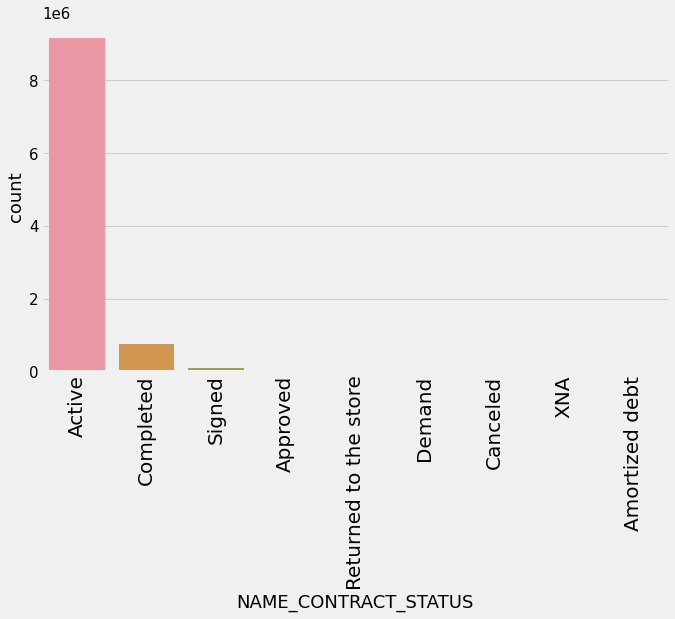

In [110]:
# Univariate Analysis

for feature in cat_fe_pos_cash_balance: 
        sns.countplot(pos_cash_balance[feature])
        plt.xticks(fontsize=20,rotation=90)

> Most of them has active contract status during the month.

# 7.6 Skewness and Kurtosis

In [111]:
for feature in num_fe_pos_cash_balance:
    print('{:15}'.format(feature),
          'Skewness: {:05.2f}'.format(pos_cash_balance[feature].skew()) , 
          '   ' ,
          'Kurtosis: {:06.2f}'.format(pos_cash_balance[feature].kurt())  
         )

MONTHS_BALANCE  Skewness: -0.67     Kurtosis: -00.71
CNT_INSTALMENT  Skewness: 01.60     Kurtosis: 002.45
CNT_INSTALMENT_FUTURE Skewness: 01.85     Kurtosis: 003.71
SK_DPD          Skewness: 14.90     Kurtosis: 255.32
SK_DPD_DEF      Skewness: 66.34     Kurtosis: 4836.55


# 7.7 Outliers

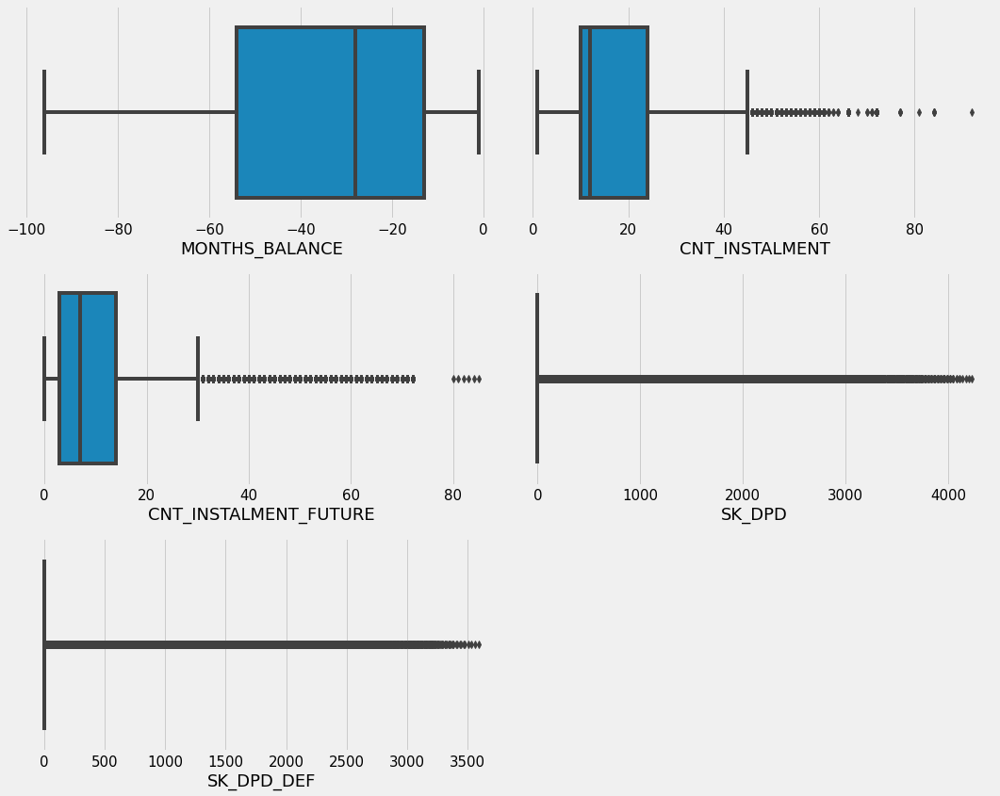

In [112]:
plt.figure(figsize=(15,12))
plotnum=1
for feature in num_fe_pos_cash_balance:
        if(plotnum<=5):
                ax=plt.subplot(3,2,plotnum) 
                sns.boxplot(pos_cash_balance[feature])
        plotnum+=1
plt.tight_layout() 

> There are outliers present. We will deal with them in the FE Section.

# 7.8 Heatmap

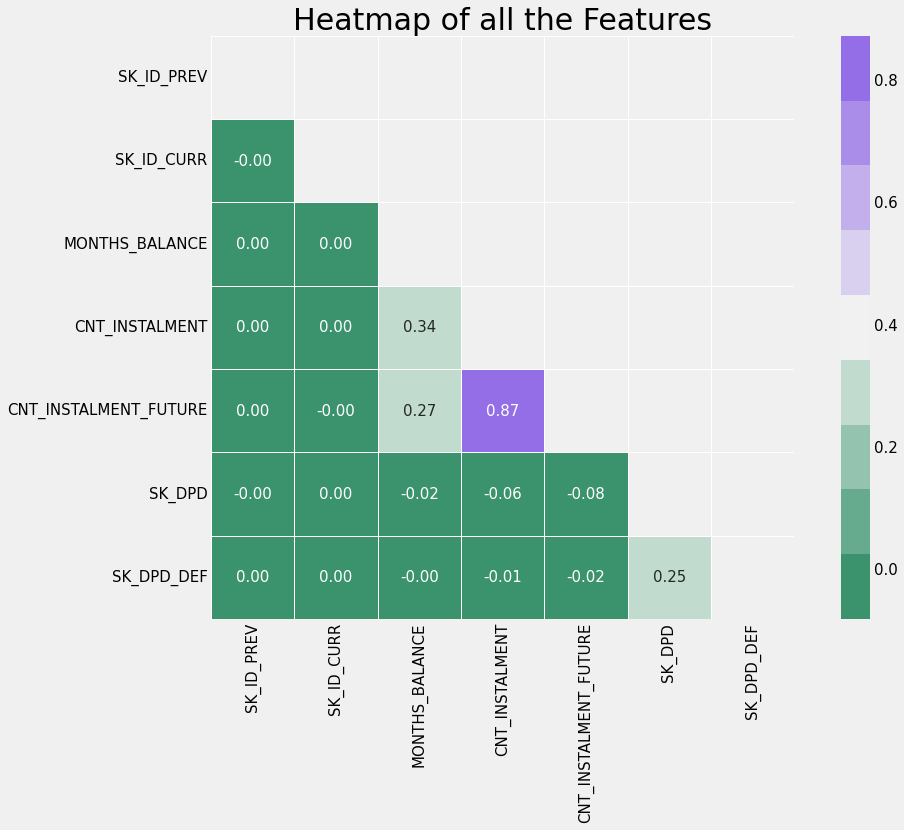

In [113]:
plt.subplots(figsize = (15,10))

mask = np.triu(np.ones_like(pos_cash_balance.corr()))

sns.heatmap(pos_cash_balance.corr(), 
            cmap=sns.diverging_palette(150, 275, s=80, l=55, n=9), 
            mask = mask, 
            annot=True, 
            square=True, linewidths=.5, fmt='.2f',annot_kws={'size': 15}
           );

plt.title("Heatmap of all the Features", fontsize = 30);

# 7.9 Multicollinearity

In [114]:
correlations=pos_cash_balance.corr()
attrs = correlations.iloc[2:,2:] 

threshold = 0.5
important_corrs = (attrs[abs(attrs) > threshold][attrs != 1.0]).unstack().dropna().to_dict()

unique_important_corrs=pd.DataFrame(important_corrs.items(),columns=['Attribute Pair', 'Correlation'])
multi_corr=unique_important_corrs.sort_values(by=['Correlation'],ascending = False,ignore_index= True)
multi_corr.iloc[::2]

,Attribute Pair,Correlation
0,"(CNT_INSTALMENT, CNT_INSTALMENT_FUTURE)",0.871276



# 8. Previous_application Data

In [115]:
previous_application=pd.read_csv('previous_application.csv')
previous_application

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.000000,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1670209,2300464,352015,Consumer loans,14704.290,267295.5,311400.0,0.0,267295.5,WEDNESDAY,12,Y,1,0.000000,NaN,NaN,XAP,Approved,-544,Cash through the bank,XAP,NaN,Refreshed,Furniture,POS,XNA,Stone,43,Furniture,30.0,low_normal,POS industry with interest,365243.0,-508.0,362.0,-358.0,-351.0,0.0
1670210,2357031,334635,Consumer loans,6622.020,87750.0,64291.5,29250.0,87750.0,TUESDAY,15,Y,1,0.340554,NaN,NaN,XAP,Approved,-1694,Cash through the bank,XAP,Unaccompanied,New,Furniture,POS,XNA,Stone,43,Furniture,12.0,middle,POS industry with interest,365243.0,-1604.0,-1274.0,-1304.0,-1297.0,0.0
1670211,2659632,249544,Consumer loans,11520.855,105237.0,102523.5,10525.5,105237.0,MONDAY,12,Y,1,0.101401,NaN,NaN,XAP,Approved,-1488,Cash through the bank,XAP,"Spouse, partner",Repeater,Consumer Electronics,POS,XNA,Country-wide,1370,Consumer electronics,10.0,low_normal,POS household with interest,365243.0,-1457.0,-1187.0,-1187.0,-1181.0,0.0
1670212,2785582,400317,Cash loans,18821.520,180000.0,191880.0,NaN,180000.0,WEDNESDAY,9,Y,1,NaN,NaN,NaN,XNA,Approved,-1185,Cash through the bank,XAP,Family,Repeater,XNA,Cash,x-sell,AP+ (Cash loan),-1,XNA,12.0,low_normal,Cash X-Sell: low,365243.0,-1155.0,-825.0,-825.0,-817.0,1.0


# 8.1 Basic Checks 

In [116]:
print('-'*100)
print('Shape of the DataFrame: ',previous_application.shape)
print('-'*100)
print('Info of the DataFrame: \n',previous_application.info())
print('-'*100)
print('Describe the DataFrame: \n',previous_application.describe())
print('-'*100)
print('Describe object types of the DataFrame: \n',previous_application.describe(include='O'))
print('-'*100)
print('Datatype of Each Column: \n',previous_application.dtypes)
print('-'*100)
print('Duplicated Values: ',previous_application.duplicated().sum())
print('-'*100)

----------------------------------------------------------------------------------------------------
Shape of the DataFrame:  (1670214, 37)
----------------------------------------------------------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-

Duplicated Values:  0
----------------------------------------------------------------------------------------------------


# 8.2 Missing Values

Your selected dataframe has 37 columns.
There are 16 columns that have missing values.


,Total,Percent
RATE_INTEREST_PRIVILEGED,1664263,99.643698
RATE_INTEREST_PRIMARY,1664263,99.643698
AMT_DOWN_PAYMENT,895844,53.636480
RATE_DOWN_PAYMENT,895844,53.636480
NAME_TYPE_SUITE,820405,49.119754
NFLAG_INSURED_ON_APPROVAL,673065,40.298129
DAYS_TERMINATION,673065,40.298129
DAYS_LAST_DUE,673065,40.298129
DAYS_LAST_DUE_1ST_VERSION,673065,40.298129
DAYS_FIRST_DUE,673065,40.298129


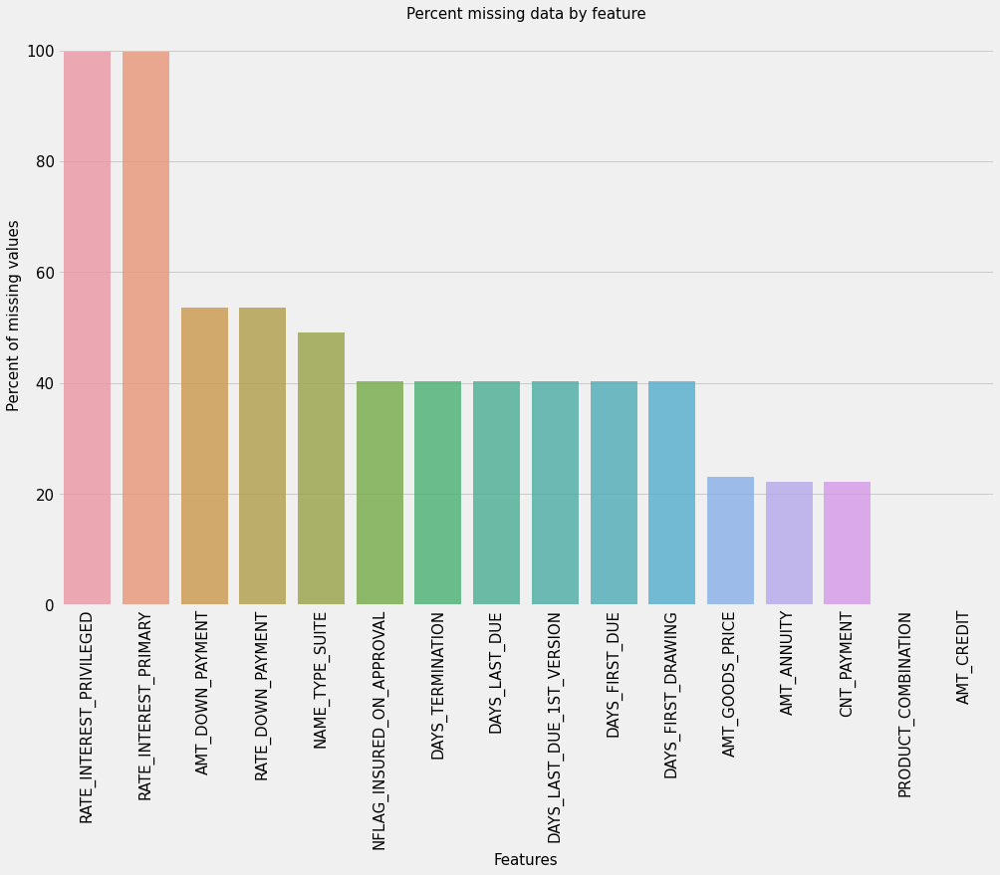

In [117]:
missing_data_previous_application = missingdata(previous_application)
missing_data_previous_application

> There are lot of missing values. We will have to impute them with something meaningful.

# 8.3 Numerical Features

In [118]:
num_fe_previous_application=[feature for feature in previous_application.columns if previous_application[feature].dtype!='O' and feature not in ['SK_ID_PREV','SK_ID_CURR']]
print('The no. of Numerical features in previous_application is : ',len(num_fe_previous_application))
print('The Numerical features in previous_application is : \n',num_fe_previous_application)

The no. of Numerical features in previous_application is :  19
The Numerical features in previous_application is : 
 ['AMT_ANNUITY', 'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE', 'HOUR_APPR_PROCESS_START', 'NFLAG_LAST_APPL_IN_DAY', 'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY', 'RATE_INTEREST_PRIVILEGED', 'DAYS_DECISION', 'SELLERPLACE_AREA', 'CNT_PAYMENT', 'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE', 'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL']


# 8.4 Discrete Features

In [119]:
# 2 Numerical features are actually Categorical
remove_col_prev_app=['NFLAG_LAST_APPL_IN_DAY','NFLAG_INSURED_ON_APPROVAL']

In [120]:
dis_fe_previous_application=['HOUR_APPR_PROCESS_START', 'DAYS_DECISION', 'CNT_PAYMENT', 'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE', 'DAYS_TERMINATION']
dis_fe_previous_application

['HOUR_APPR_PROCESS_START',
 'DAYS_DECISION',
 'CNT_PAYMENT',
 'DAYS_FIRST_DRAWING',
 'DAYS_FIRST_DUE',
 'DAYS_LAST_DUE_1ST_VERSION',
 'DAYS_LAST_DUE',
 'DAYS_TERMINATION']

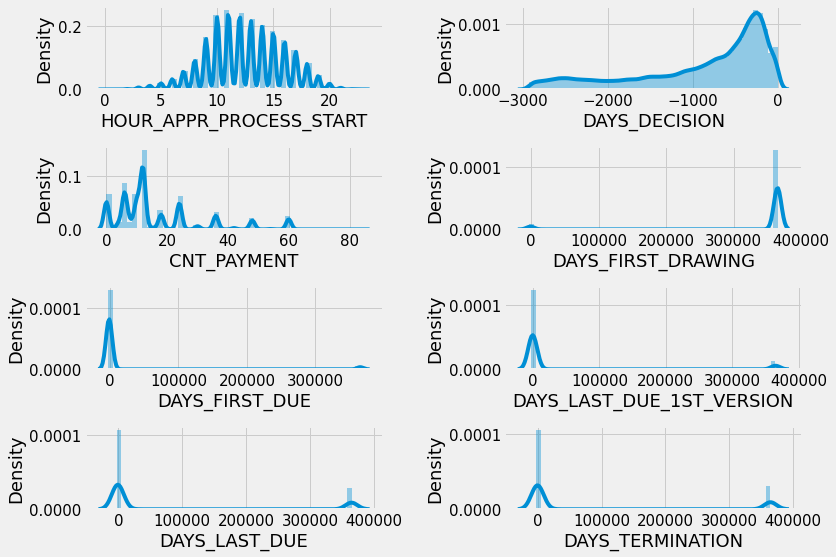

In [121]:
# Univariate Analysis :

plt.figure(figsize=(12,8))
plotnum=1
for feature in dis_fe_previous_application:
    if(plotnum<=8):
        ax=plt.subplot(4,2,plotnum) 
        sns.distplot(previous_application[feature])
    plotnum+=1
plt.tight_layout()  

> - Client applied for loan mostly at peak hours just like current application.
> - Decision regards to previous application was made almost 500 days back relative to current application
> - Term of previous credit of previous application is similar to current application previous term.

# 8.5 Continous Features

In [122]:
conti_fe_previous_application=[feature for feature in num_fe_previous_application if feature not in dis_fe_previous_application+['NFLAG_LAST_APPL_IN_DAY','NFLAG_INSURED_ON_APPROVAL']]
conti_fe_previous_application

['AMT_ANNUITY',
 'AMT_APPLICATION',
 'AMT_CREDIT',
 'AMT_DOWN_PAYMENT',
 'AMT_GOODS_PRICE',
 'RATE_DOWN_PAYMENT',
 'RATE_INTEREST_PRIMARY',
 'RATE_INTEREST_PRIVILEGED',
 'SELLERPLACE_AREA']

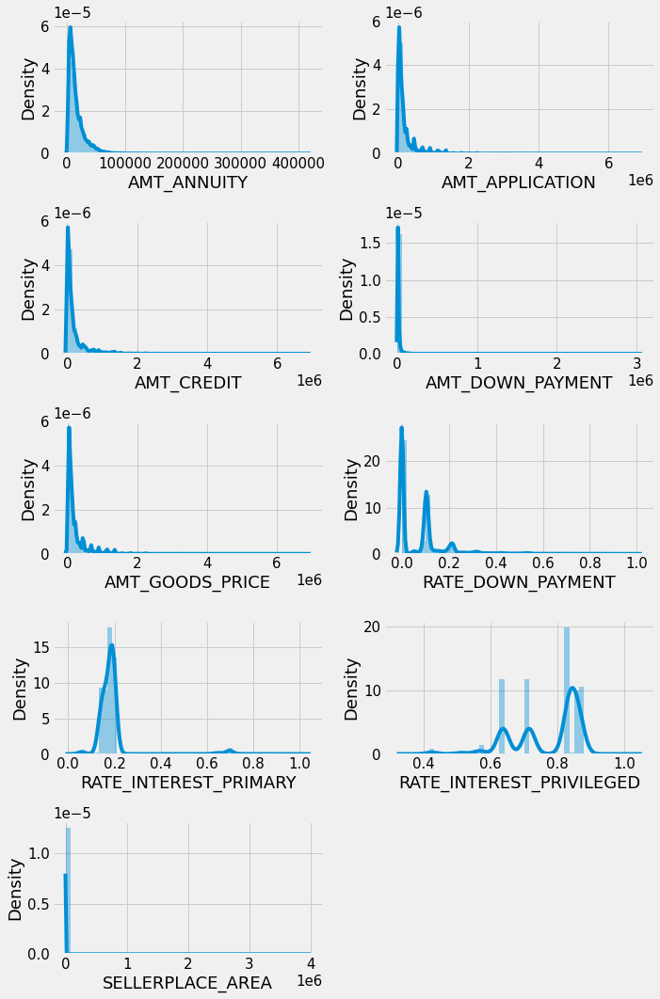

In [123]:
# Univariate Analysis :

plt.figure(figsize=(10,15))
plotnum=1
for feature in conti_fe_previous_application:
    if(plotnum<=9):
        ax=plt.subplot(5,2,plotnum) 
        sns.distplot(previous_application[feature])
    plotnum+=1
plt.tight_layout()  

> - Annunity of previous application was mostly 20000.
> - The Clients mostly asked upto 100k credit on previous application.
> - Amount credit actually recieved differed from what client asked after 50k.
> - Goods price of goods on previous application were close to 50k.
> - Normalized Intrest rate was common for most of the clients.

# 8.6 Categorical Features

In [124]:
cat_fe_previous_application=[feature for feature in previous_application.columns if previous_application[feature].dtype=='O']
print('The no. of Categorical features in previous_application is : ',len(cat_fe_previous_application))
print('The Categorical features in previous_application is : \n',cat_fe_previous_application)

The no. of Categorical features in previous_application is :  16
The Categorical features in previous_application is : 
 ['NAME_CONTRACT_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'FLAG_LAST_APPL_PER_CONTRACT', 'NAME_CASH_LOAN_PURPOSE', 'NAME_CONTRACT_STATUS', 'NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON', 'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE', 'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE', 'CHANNEL_TYPE', 'NAME_SELLER_INDUSTRY', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION']


## Number of Unique categories in each feature

In [125]:
for feature in cat_fe_previous_application:
    print('The no. of unique categories in {} feature of previous_application is : {}'.format(feature,previous_application[feature].nunique()))

The no. of unique categories in NAME_CONTRACT_TYPE feature of previous_application is : 4
The no. of unique categories in WEEKDAY_APPR_PROCESS_START feature of previous_application is : 7
The no. of unique categories in FLAG_LAST_APPL_PER_CONTRACT feature of previous_application is : 2
The no. of unique categories in NAME_CASH_LOAN_PURPOSE feature of previous_application is : 25
The no. of unique categories in NAME_CONTRACT_STATUS feature of previous_application is : 4
The no. of unique categories in NAME_PAYMENT_TYPE feature of previous_application is : 4
The no. of unique categories in CODE_REJECT_REASON feature of previous_application is : 9
The no. of unique categories in NAME_TYPE_SUITE feature of previous_application is : 7
The no. of unique categories in NAME_CLIENT_TYPE feature of previous_application is : 4
The no. of unique categories in NAME_GOODS_CATEGORY feature of previous_application is : 28
The no. of unique categories in NAME_PORTFOLIO feature of previous_application i

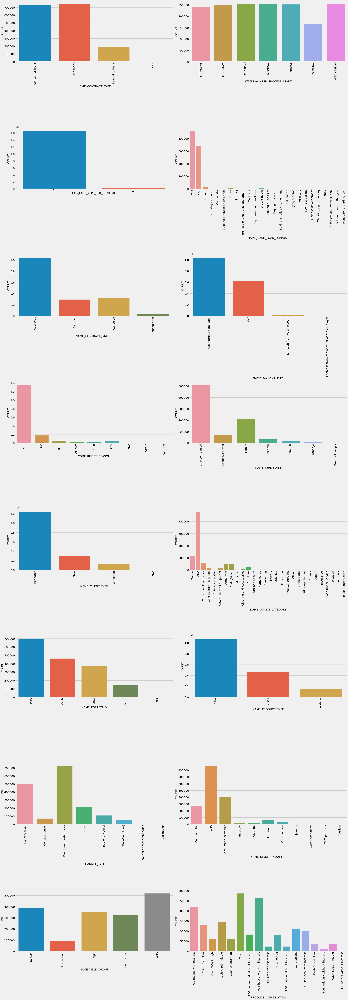

In [126]:
# Univariate Analysis

plt.figure(figsize=(35,100))
plotnum=1
for feature in cat_fe_previous_application:
    if(plotnum<=len(cat_fe_previous_application)): 
        ax=plt.subplot(8,2,plotnum) 
        sns.countplot(previous_application[feature])
        plt.xlabel(feature,fontsize=20) 
        plt.ylabel('COUNT',fontsize=20)
        plt.xticks(fontsize=20,rotation=90)
        plt.yticks(fontsize=20)
    plotnum+=1
plt.tight_layout() 

> - There are 4 types of contract in the previous application data, 3 are very common: Cash loans, Consumer loans, Revolving loans. Cash loans and Consumer loans are almost the same whilst Revolving loans are less.
> - Besides not identifed/not available categories, Repairs, Other, Urgent needs, Buying a used car, Building a house or an annex accounts for the largest number of contracts. 
> - Most previous applications contract statuses are Approved.
> - Most of the previous applications were paid with Cash through the bank.
> - Most of the previous applications have client type Repeater (~1M), just over 200K are New and ~100K are Refreshed.

## Analysis of few Numerical variables which are actually Categorical

<font color='chocolate'>We will keep this Numerical for now for our Analysis. We do need to remember that now our no. of categorical features are actually `16+2=18`. </font>

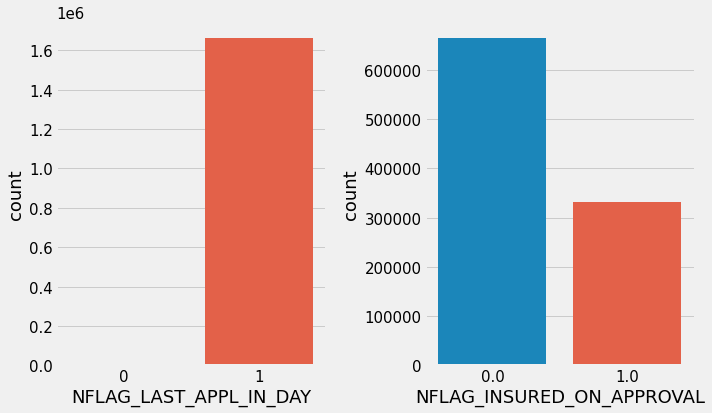

In [127]:
plotnum=1
for feature in remove_col_prev_app:
    if(plotnum<=2): 
        ax=plt.subplot(1,2,plotnum) 
        sns.countplot(previous_application[feature])
    plotnum+=1
plt.tight_layout()

> - Most of the applications per day was the last application of the clients. That means they did not apply for more than 1 application
> - Almost half of applications were for micro finance loan

# 8.7 Skewness and Kurtosis

In [128]:
for feature in num_fe_previous_application:
    print('{:15}'.format(feature), 
          'Skewness: {:05.2f}'.format(previous_application[feature].skew()) , 
          '   ' ,
          'Kurtosis: {:06.2f}'.format(previous_application[feature].kurt())  
         )

AMT_ANNUITY     Skewness: 02.69     Kurtosis: 015.07
AMT_APPLICATION Skewness: 03.39     Kurtosis: 015.76
AMT_CREDIT      Skewness: 03.25     Kurtosis: 014.24
AMT_DOWN_PAYMENT Skewness: 36.48     Kurtosis: 2901.84
AMT_GOODS_PRICE Skewness: 03.07     Kurtosis: 012.87
HOUR_APPR_PROCESS_START Skewness: -0.03     Kurtosis: -00.28
NFLAG_LAST_APPL_IN_DAY Skewness: -16.74     Kurtosis: 278.09
RATE_DOWN_PAYMENT Skewness: 02.11     Kurtosis: 006.20
RATE_INTEREST_PRIMARY Skewness: 05.20     Kurtosis: 028.20
RATE_INTEREST_PRIVILEGED Skewness: -1.01     Kurtosis: 000.26
DAYS_DECISION   Skewness: -1.05     Kurtosis: -00.04
SELLERPLACE_AREA Skewness: 529.62     Kurtosis: 296880.64
CNT_PAYMENT     Skewness: 01.53     Kurtosis: 001.87
DAYS_FIRST_DRAWING Skewness: -3.60     Kurtosis: 010.97
DAYS_FIRST_DUE  Skewness: 04.64     Kurtosis: 019.57
DAYS_LAST_DUE_1ST_VERSION Skewness: 02.78     Kurtosis: 005.73
DAYS_LAST_DUE   Skewness: 01.41     Kurtosis: -00.01
DAYS_TERMINATION Skewness: 01.31     Kurtosis:

# 8.8 Outliers

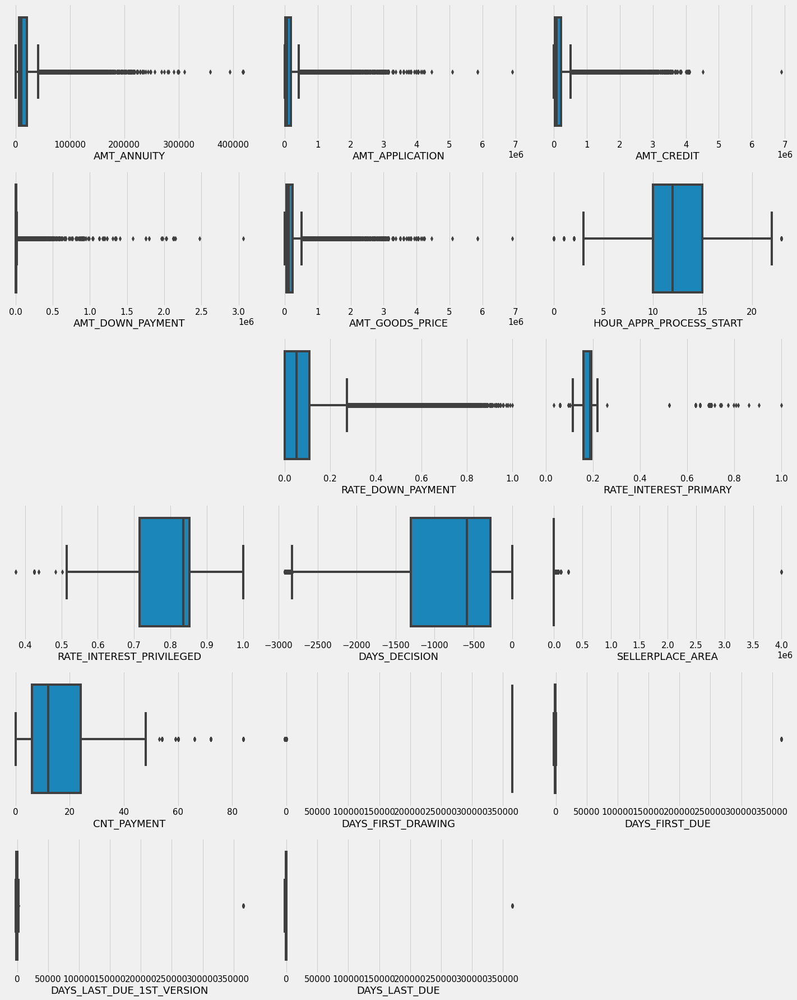

In [129]:
plt.figure(figsize=(20,25))
plotnum=1
for feature in num_fe_previous_application:
    if feature not in remove_col_prev_app:
        if(plotnum<=17):
            ax=plt.subplot(6,3,plotnum) 
            sns.boxplot(previous_application[feature])
    plotnum+=1
plt.tight_layout() 

> There are outliers present. We will deal with them in the FE Section.

# 8.9 Heatmap

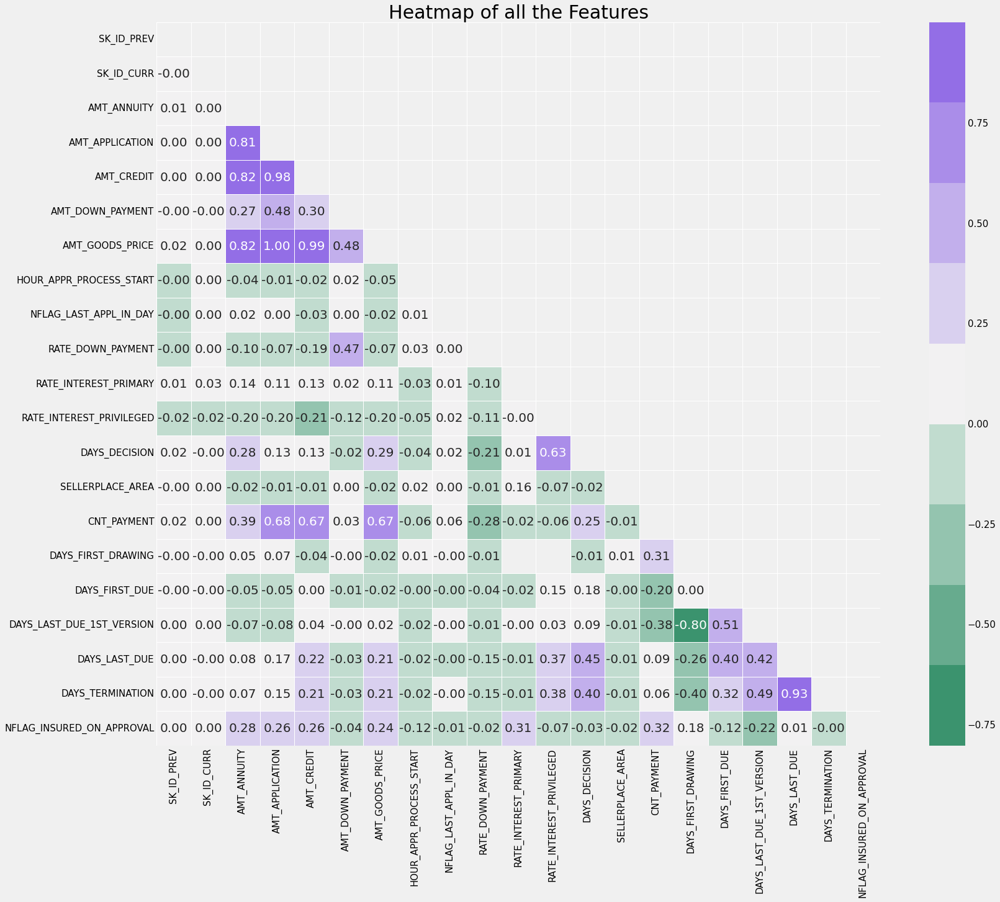

In [130]:
plt.subplots(figsize = (25,20))

mask = np.triu(np.ones_like(previous_application.corr()))

sns.heatmap(previous_application.corr(), 
            cmap=sns.diverging_palette(150, 275, s=80, l=55, n=9), 
            mask = mask, 
            annot=True, 
            square=True, linewidths=.5, fmt='.2f',annot_kws={'size': 20}
           );

plt.title("Heatmap of all the Features", fontsize = 30);

# 8.10 Multicollinearity

In [131]:
correlations=previous_application.corr()
attrs = correlations.iloc[2:,2:] 

threshold = 0.5
important_corrs = (attrs[abs(attrs) > threshold][attrs != 1.0]).unstack().dropna().to_dict()

unique_important_corrs=pd.DataFrame(important_corrs.items(),columns=['Attribute Pair', 'Correlation'])
multi_corr=unique_important_corrs.sort_values(by=['Correlation'],ascending = False,ignore_index= True)
multi_corr.iloc[::2]

,Attribute Pair,Correlation
0,"(AMT_GOODS_PRICE, AMT_APPLICATION)",0.999884
2,"(AMT_GOODS_PRICE, AMT_CREDIT)",0.993087
4,"(AMT_CREDIT, AMT_APPLICATION)",0.975824
6,"(DAYS_LAST_DUE, DAYS_TERMINATION)",0.927990
8,"(AMT_ANNUITY, AMT_GOODS_PRICE)",0.820895
10,"(AMT_CREDIT, AMT_ANNUITY)",0.816429
12,"(AMT_ANNUITY, AMT_APPLICATION)",0.808872
14,"(AMT_APPLICATION, CNT_PAYMENT)",0.680630
16,"(CNT_PAYMENT, AMT_CREDIT)",0.674278
18,"(AMT_GOODS_PRICE, CNT_PAYMENT)",0.672129


---